#### Importing required libraries

In [1]:
import os
import PIL
import json
import random
import shutil
import pickle
from tqdm import tqdm
from PIL import Image
from scipy import stats
from pathlib import Path
from tabulate import tabulate

import cv2
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

from xgboost import XGBClassifier

from skimage.io import imread, imshow
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GroupShuffleSplit
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

#### Data

In [4]:
DATA_DIR = "/content/drive/MyDrive/DH_307/OPMD_DATASET"

In [5]:
IMAGE_DIR                 = os.path.join(DATA_DIR, "Images")
ANNOTATION_FILE           = os.path.join(DATA_DIR, "Annotation.json")
IMAGEWISE_METADATA_FILE   = os.path.join(DATA_DIR, "Imagewise_Data.xlsx")
PATIENTWISE_METADATA_FILE = os.path.join(DATA_DIR, "Patientwise_Data.xlsx")

#### EDA on "Imagewise_Data.xlsx"

In [ ]:
df1 = pd.read_excel(IMAGEWISE_METADATA_FILE)

In [ ]:
print(f"No.of rows: {df1.shape[0]}")
print(f"No.of columns: {df1.shape[1]}")

No.of rows: 3000
No.of columns: 4


In [ ]:
df1.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
2,R-01-03,Benign,Coated Tongue,1
3,R-02-01,Benign,VBD,1
4,R-02-02,Benign,VBD,1


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Image Name               3000 non-null   object
 1   Category                 3000 non-null   object
 2   Clinical Diagnosis       3000 non-null   object
 3   Lesion Annotation Count  3000 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 93.9+ KB


In [ ]:
print("Number of unique values in each column:\n")
print(df1.nunique())

Number of unique values in each column:

Image Name                 3000
Category                      4
Clinical Diagnosis          155
Lesion Annotation Count       9
dtype: int64


In [ ]:
df1['Category'] = df1['Category'].astype('category')

In [ ]:
df1['Lesion Annotation Count'] = df1['Lesion Annotation Count'].astype("int8")

In [ ]:
print(df1.dtypes)

Image Name                   object
Category                   category
Clinical Diagnosis           object
Lesion Annotation Count        int8
dtype: object


In [ ]:
def analyze_column(df, column_to_analyze):

  # Get value counts and percentages
  value_counts = df[column_to_analyze].value_counts()
  percentages  = (value_counts / len(df))*100

  print(f"Unique values in '{column_to_analyze}':")

  # print counts and percentages
  for value, count in value_counts.items():
    percentage = percentages[value]
    print(f"{value}: {count} ({percentage:.2f}%)")

  print(f'\nTotal unique values: {len(value_counts)}')
  print(f"Total records: {len(df)}")

  # Calculate and print imbalance ratio
  if len(value_counts) >= 2:
    majority_count  = value_counts.iloc[0]
    minority_count  = value_counts.iloc[-1]
    imbalance_ratio = majority_count / minority_count
    print(f"Imbalance ratio: {imbalance_ratio:.0f}:1 (majority:minority)\n")
  else:
    print("Imbalance ratio: Cannot calculate (ony one class present)")

  # create bar plot
  plt.figure(figsize=(6,3))
  bars = value_counts.plot(kind='bar', color='lightgreen', edgecolor='black')

  plt.title(f'Distribution of {column_to_analyze}', fontsize=14)
  plt.xlabel(column_to_analyze)
  plt.ylabel('Count')
  plt.xticks(rotation=0, ha='center')

  # Add value labels on bars (count and percentage)
  for i, (v,p) in enumerate(zip(value_counts, percentages)):
    label = f"{v}\n({p:.1f}%)"
    plt.text(i, v + 0.05 * max(value_counts), label,
             ha = 'center', va='bottom', fontweight='bold', fontsize=9)

  plt.tight_layout()
  plt.show()

Unique values in 'Category':
OPMD: 1394 (46.47%)
Benign: 748 (24.93%)
Healthy: 729 (24.30%)
OCA: 129 (4.30%)

Total unique values: 4
Total records: 3000
Imbalance ratio: 11:1 (majority:minority)



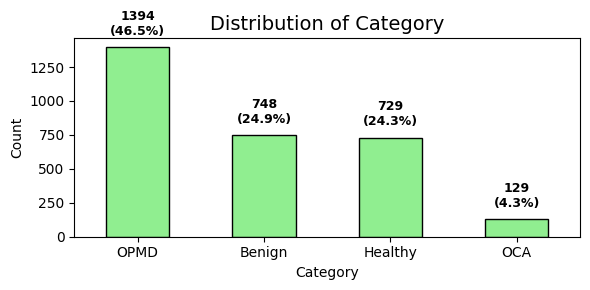

In [ ]:
analyze_column(df1, 'Category')

Unique values in 'Lesion Annotation Count':
1: 1621 (54.03%)
0: 729 (24.30%)
2: 383 (12.77%)
3: 168 (5.60%)
4: 59 (1.97%)
5: 19 (0.63%)
6: 15 (0.50%)
8: 3 (0.10%)
7: 3 (0.10%)

Total unique values: 9
Total records: 3000
Imbalance ratio: 540:1 (majority:minority)



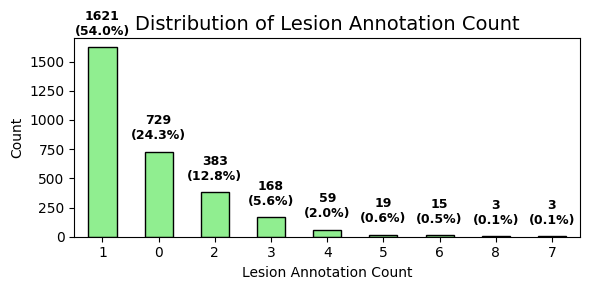

In [ ]:
analyze_column(df1, 'Lesion Annotation Count')

In [ ]:
def analyze_column_with_high_cardinality(df, column_to_analyze, top_n=None):

    print(f"Comprehensive Analysis for the column '{column_to_analyze}'")

    # Get value counts
    value_counts = df[column_to_analyze].value_counts()
    total_unique = len(value_counts)

    print(f"Total no.of unique values: {total_unique}")
    print(f"\nTop {top_n} most frequent values:")
    print(value_counts.head(top_n))

    print(f"\nBottom {min(5, total_unique)} least frequent values:")
    print(value_counts.tail(min(5, total_unique)))

    # Summary statistics
    print(f"\nSummary Statistics:")
    print(f"Most common value: '{value_counts.index[0]}' (count: {value_counts.iloc[0]})")
    print(f"Proportion of most common value: {value_counts.iloc[0]/len(df)*100:.2f}%")
    print(f"Number of values that appear only once: {(value_counts == 1).sum()}")
    print(f"Proportion of dataset covered by top 20 values: {value_counts.head(20).sum()/len(df)*100:.2f}%\n")

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

    # Plot 1: Top N values
    top_values = value_counts.head(top_n)
    bars1      = ax1.bar(range(len(top_values)), top_values.values, color='skyblue', edgecolor='black')
    ax1.set_title(f'Top {top_n} {column_to_analyze}', fontweight='bold')
    ax1.set_xlabel(column_to_analyze)
    ax1.set_ylabel('Count')
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_xticks(range(len(top_values)))
    ax1.set_xticklabels(top_values.index, ha='right')

    # Add value labels on top of bars
    for i, v in enumerate(top_values.values):
        ax1.text(i, v + 0.01 * max(top_values.values), str(v),
                ha='center', va='bottom', fontweight='bold', fontsize=8)

    # Plot 2: Cumulative distribution
    cumulative_pct = value_counts.cumsum() / len(df) * 100
    ax2.plot(range(1, len(cumulative_pct) + 1), cumulative_pct, 'b-', linewidth=2)
    ax2.set_title('Cumulative Distribution', fontweight='bold')
    ax2.set_xlabel('Number of Unique Values')
    ax2.set_ylabel('Cumulative Percentage (%)')
    ax2.grid(True, alpha=0.3)

    # Mark some key points
    for n in [5, 10, 20, 50]:
        if n <= len(cumulative_pct):
            ax2.axvline(x=n, color='red', linestyle='--', alpha=0.7)
            ax2.text(n, cumulative_pct.iloc[n-1] + 2, f'{cumulative_pct.iloc[n-1]:.1f}%',
                    ha='center', fontweight='bold')

    return value_counts

Comprehensive Analysis for the column 'Clinical Diagnosis'
Total no.of unique values: 155

Top 20 most frequent values:
Clinical Diagnosis
Normal Mucosa          728
OSF                    684
OLP                    358
Oral Cancer            125
VBD                    123
Candidiasis             81
OLP/LR                  78
Leukoplakia             70
Erythema Multiforme     45
OLP/ LR                 40
OFG                     34
RAU                     33
Coated Tongue           30
Mucocele                28
Allergy                 20
Leukplakia              19
Angular Cheilitis       15
MRG                     15
Erythroplakia           14
Trumatic Lesion         14
Name: count, dtype: int64

Bottom 5 least frequent values:
Clinical Diagnosis
OSF+Cyst              1
Allergic Reaction     1
Petichiae             1
Mucosil               1
Alevolar Keratosis    1
Name: count, dtype: int64

Summary Statistics:
Most common value: 'Normal Mucosa' (count: 728)
Proportion of most common va

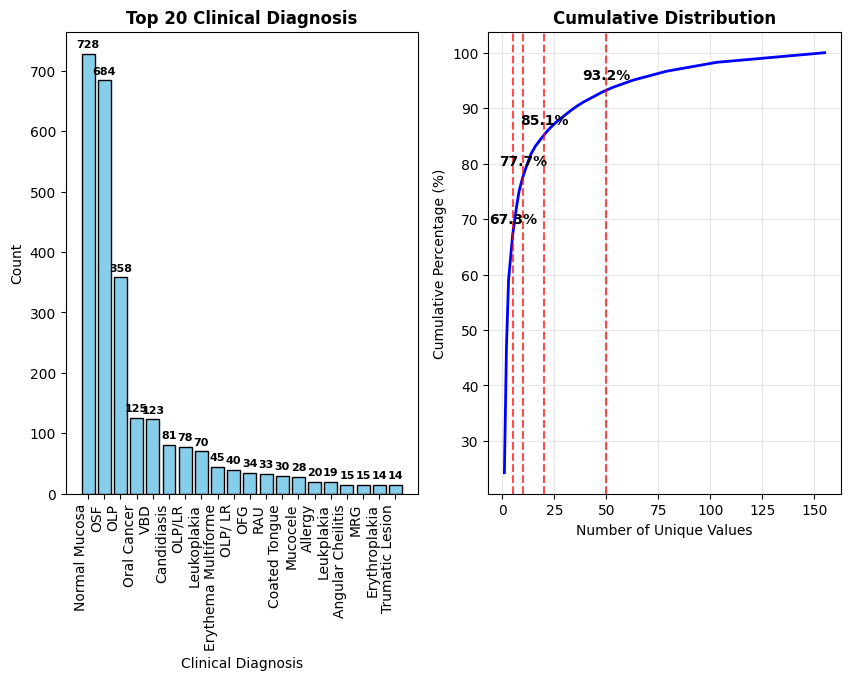

In [ ]:
clinical_diagnosis_counts = analyze_column_with_high_cardinality(df1, 'Clinical Diagnosis', top_n=20)

#### Comparitive Analysis Of Three Columns

In [ ]:
def diagnoses_by_category(df, category_name):
    """
    Get all diagnosis types for a specific category
    """
    # Filter data for the specific category
    category_data = df[df['Category'] == category_name]

    # Get diagnosis counts
    diagnosis_counts = category_data['Clinical Diagnosis'].value_counts()

    print(f"Diagnosis types for the category '{category_name}'")
    print(f"Total images in category: {len(category_data)}")
    print(f"Unique diagnoses: {len(diagnosis_counts)}")

In [ ]:
def diagnoses_count_by_category(df, category_name):
    """
    Get all diagnosis types and their counts for a specific category
    """
    # Filter data for the specific category
    category_data = df[df['Category'] == category_name]

    # Get diagnosis counts
    diagnosis_counts = category_data['Clinical Diagnosis'].value_counts()

    for diagnosis, count in diagnosis_counts.items():
        print(f"{diagnosis:<50} {count:>3} images")

In [ ]:
diagnoses_by_category(df1, 'OPMD')

Diagnosis types for the category 'OPMD'
Total images in category: 1394
Unique diagnoses: 43


In [ ]:
diagnoses_count_by_category(df1, 'OPMD')

OSF                                                684 images
OLP                                                356 images
OLP/LR                                              78 images
Leukoplakia                                         69 images
OLP/ LR                                             40 images
Leukplakia                                          19 images
PVL                                                 14 images
Erythroplakia                                       14 images
Leukoplakia + OSF                                   12 images
OLP /LR                                             11 images
Early OSF                                            9 images
OLP/DLE                                              9 images
OLP/ PVL                                             9 images
Leukplakia + OSF                                     7 images
Homogenous Leukoplakia                               6 images
Leukoplakia/ Candidiasis                             6 images
Erythrol

* OSF: Oral Submucous Fibrosis. It is a chronic, progressive disease characterized by the inflammation and fibrosis (scarring) of the submucosal tissues. This leads to stiffness of the oral mucosa, causing a burning sensation and eventually a severe inability to open the mouth (trismus).
It is a well-established OPMD with a significant risk of transforming into oral cancer (oral squamous cell carcinoma).

In [ ]:
diagnoses_by_category(df1, 'Benign')

Diagnosis types for the category 'Benign'
Total images in category: 748
Unique diagnoses: 110


In [ ]:
diagnoses_count_by_category(df1, 'Benign')

VBD                                                123 images
Candidiasis                                         81 images
Erythema Multiforme                                 45 images
OFG                                                 34 images
RAU                                                 33 images
Coated Tongue                                       29 images
Mucocele                                            28 images
Allergy                                             20 images
Angular Cheilitis                                   15 images
MRG                                                 15 images
Trumatic Lesion                                     14 images
Trumatic Ulcer                                      13 images
Herpes Zoster                                       11 images
Leukodema                                           10 images
Frictional Lesion                                    9 images
Pemphigoid                                           9 images
Geograph

* VBD (Vascular Benign Diagnosis) is a non-cancerous (benign) lesion that originates from blood vessels

In [ ]:
diagnoses_by_category(df1, 'Healthy')

Diagnosis types for the category 'Healthy'
Total images in category: 729
Unique diagnoses: 2


In [ ]:
diagnoses_count_by_category(df1, 'Healthy')

Normal Mucosa                                      727 images
OLP                                                  2 images


* OLP(Oral Lichen Planus) is a chronic inflammatory condition that affects the mucous membranes inside the mouth. It is not an infection and is not contagious




In [ ]:
diagnoses_by_category(df1, 'OCA')

Diagnosis types for the category 'OCA'
Total images in category: 129
Unique diagnoses: 4


In [ ]:
diagnoses_count_by_category(df1, 'OCA')

Oral Cancer                                        125 images
Verrucus Carcinoma                                   2 images
Oral Cancer + Leukoplakia                            1 images
Verucouss Ca                                         1 images


In [ ]:
# Category vs Lesion Annotation Count
print(" Category vs Lesion Annotation Count")
print("-" * 50)
category_lesion_stats = df1.groupby('Category',observed=True)['Lesion Annotation Count'].agg([
                        ('count', 'count'),
                        ('min', 'min'),
                        ('max', 'max'),
                        ('total_lesions', 'sum')]).round(2).sort_values('count',ascending=False)

print("Lesion Statistics by Category:")
print(category_lesion_stats)

 Category vs Lesion Annotation Count
--------------------------------------------------
Lesion Statistics by Category:
          count  min  max  total_lesions
Category                                
OPMD       1394    1    8           2037
Benign      748    1    8           1189
Healthy     729    0    0              0
OCA         129    1    2            131


In [ ]:
# Clinical Diagnosis vs Lesion Annotation Count (for top diagnoses)
print("\nTop Clinical Diagnoses vs Lesion Annotation count")
print("-" * 50)
top_10_diagnoses = df1['Clinical Diagnosis'].value_counts().head(10).index
top_diagnoses_df = df1[df1['Clinical Diagnosis'].isin(top_10_diagnoses)]

diagnosis_lesion_stats = top_diagnoses_df.groupby('Clinical Diagnosis')['Lesion Annotation Count'].agg([
                        ('image_count', 'count'),
                        ('min_lesions', 'min'),
                        ('max_lesions', 'max'),
                        ('total_lesions', 'sum')
                    ]).round(2).sort_values('image_count', ascending=False)

print("Lesion Statistics for Top 10 Clinical Diagnoses:")
print(diagnosis_lesion_stats)


Top Clinical Diagnoses vs Lesion Annotation count
--------------------------------------------------
Lesion Statistics for Top 10 Clinical Diagnoses:
                     image_count  min_lesions  max_lesions  total_lesions
Clinical Diagnosis                                                       
Normal Mucosa                728            0            1              1
OSF                          684            1            7            795
OLP                          358            0            8            699
Oral Cancer                  125            1            2            127
VBD                          123            1            8            279
Candidiasis                   81            1            6            159
OLP/LR                        78            1            4            125
Leukoplakia                   70            1            6            107
Erythema Multiforme           45            1            7             80
OLP/ LR                       40   

In [ ]:
# Combined analysis: All three columns
print("\n Combined Analysis: Category + Clinical Diagnosis + Lesion Count")
print("-" * 50)

# Create a summary table for the most common diagnosis in each category
category_diagnosis_summary = df1.groupby(['Category', 'Clinical Diagnosis'],observed=False).agg({
    'Lesion Annotation Count': ['count', 'sum']
}).round(2)

category_diagnosis_summary.columns = ['image_count', 'total_lesions']
category_diagnosis_summary = category_diagnosis_summary.reset_index()

# Get top diagnosis for each category
top_diagnosis_per_category = category_diagnosis_summary.sort_values(
    ['Category', 'image_count'], ascending=[True, False]
).groupby('Category',observed=False).first()

print("Most Common Clinical Diagnosis in Each Category:\n")
print(top_diagnosis_per_category)


 Combined Analysis: Category + Clinical Diagnosis + Lesion Count
--------------------------------------------------
Most Common Clinical Diagnosis in Each Category:

         Clinical Diagnosis  image_count  total_lesions
Category                                               
Benign                  VBD          123            279
Healthy       Normal Mucosa          727              0
OCA             Oral Cancer          125            127
OPMD                    OSF          684            795


In [ ]:
def get_unique_diagnoses_list(df, diagnosis_column='Clinical Diagnosis'):
    """
    Get a DataFrame listing all unique diagnoses
    """
    if diagnosis_column not in df.columns:
        print(f"Column '{diagnosis_column}' not found in DataFrame")
        return None

    unique_diagnoses = df[diagnosis_column].dropna().unique()

    # Create DataFrame with diagnoses in multiple columns
    diagnoses_list_df = pd.DataFrame(columns=[f'Diagnosis_{i+1}' for i in range(20)])

    # Fill the DataFrame
    for i, diagnosis in enumerate(unique_diagnoses):
        col_idx = i % 20
        row_idx = i // 20
        if row_idx >= len(diagnoses_list_df):
            diagnoses_list_df.loc[row_idx] = [None] * 20
        diagnoses_list_df.iloc[row_idx, col_idx] = diagnosis

    print(f"Total unique clinical diagnoses: {len(unique_diagnoses)}")
    return diagnoses_list_df

In [ ]:
get_unique_diagnoses_list(df1,'Clinical Diagnosis')

Total unique clinical diagnoses: 155


,Diagnosis_1,Diagnosis_2,Diagnosis_3,Diagnosis_4,Diagnosis_5,Diagnosis_6,Diagnosis_7,Diagnosis_8,Diagnosis_9,Diagnosis_10,Diagnosis_11,Diagnosis_12,Diagnosis_13,Diagnosis_14,Diagnosis_15,Diagnosis_16,Diagnosis_17,Diagnosis_18,Diagnosis_19,Diagnosis_20
0,Leukoplakia,Coated Tongue,VBD,Normal Mucosa,Viral Infection/ RAU,Oral Cancer,RAU,OLP,OSF,Leukodema,Neuroma,Geographic Tongue,Leukoplakia/ Candidiasis,Leukopakia,Candidiasis,Surgical Defect,OLP/LR,Erythroplkia,Trumatic Ulcer,Haemangioma
1,Fibrous Hyperplasia,Cheek Bitting,OSF + Leukoplakia,Depapillated Tongue,Early OSF,Fibrous Epulis,Erythema Multiforme,OSF+Leukoplakia,MRG,Mucocele,Allergy,Herpes Zpster,Papiloma,FEP,OFG,Fibromatosis,Exfoliative Chelitis,Pyogenic Granuloma,Erythma Multiforme,Traumatic Ulcer
2,OLP + Candidiasis,Scar,Erythroplakia,OLP/ PVL,Sinus Tract,Cyst,Erythroleukoplakia,Smokers Palate,Erosive Lichan Planus,Epulis,Aphthous Ulcers,Folialte Papillitis,Ulcers,FoliateÂ Papillitis,Candidiasis,Fibroepithelial Polyp,Payogenic Granuloma,Angular Cheilitis,Denture Stomatitis,Leukoplakia + OSF
3,VBD/Aphthous Ulcers,OLP (Erosive),Orofacial Granulomatosis,Gingival Hyperplasia/Gingival Fibromatosis,Ulcer,White Coated Tongue,OSF + Angular Cheilitis,Erythroplakia + OSF,Glossitis,Fissured Tongue,Candiasis,Mild Glossitis,Alveolar Ridge Keratosis,Mucolele,OLP + Coated Tongue,Angular Cheilitis + OSF,Vesiculo Bullous Disease,Desquamative Gingivitis + OLP,Verrucous Hyperplasia,Oral Submucous Fibrosis
4,Erythroplakia In Background Of OSF,Depaillation With Leukoplakia,Ranula/ Dermoid Cycst,Median Rhomboid Glossitis,Leukplakia,Erythroleukoplakia,Foliate Papilitis,Veruco Papillary Lesion,Hairy Tongue,Verrucopappilary Lesion,Pemphigus,Apthous Ulcer,Fibro Epithelail Polyp,Alveolar Kertitis,Leukplakia + OSF,Verrucus Carcinoma,Minor Salivary Gland Tumour,Pemphigoid,Olr,Hairy Tongue / VBD
5,Phebolith,Viral Wart,Osteoradionecrosis,Epulis,Mucosele,Haematoma,Depigmentation,Traumatic Ulcer,Oral Ulcers,Erythema Multiform,Glossitis,Hemangioma,DLE,DLE/OLP,Vascular Epulis,Hairy Toungue,Alveolar Keratosis,Leukoplakia,Lipoma,Denture Stomatitis+ Smokers Palate
6,Frictional Lesion,OLP+ Leukoplakia,Oral Cancer + Leukoplakia,OSF+Cyst,Oral Ulcer,Petichiae,Early Leukoplakia,Verucouss Ca,FEP + MRG + Ulcer,Allergic Reaction,Paroid Orifce Infection,DLE/ LR,Trumatic Keratosis,Opeculum,Macule,Candidiasis+ OSF,Ranula,PVL,OSF+ Leukolpka,Mucosil
7,Varix,Geogrphic Tongue,Major Apthous Ulcer,Homogenous Leukoplakia,Osteoma,Trumatic Lesion,Non-Homogenous Leukoplia,Erythema Multiforme + Caoted Tongue,Alevolar Keratosis,Gliosis + Pale Mucos,OLP/ LR,OLP /LR,VBD + Coated Tongue,Herpes Zoster,OLP/DLE,None,None,None,None,None


In [ ]:
print("COMPREHENSIVE DATA QUALITY CHECK")
print("=" * 60)

# Check for empty strings and whitespace issues
print("CHECKING FOR EMPTY STRINGS AND WHITESPACE ISSUES:")
print("-" * 50)

# Check for truly empty strings
empty_strings = df1['Clinical Diagnosis'].str.strip() == ''
print(f"Number of truly empty strings: {empty_strings.sum()}")

# Check for strings that are only whitespace
whitespace_only = df1['Clinical Diagnosis'].str.isspace()
print(f"Number of whitespace-only strings: {whitespace_only.sum()}")

# Check for strings with leading/trailing whitespace
has_whitespace = df1['Clinical Diagnosis'] != df1['Clinical Diagnosis'].str.strip()
print(f"Number of strings with leading/trailing whitespace: {has_whitespace.sum()}")

# Show examples of strings with whitespace issues
if has_whitespace.any():
    print("\nExamples of strings with whitespace issues:")
    examples = df1[has_whitespace]['Clinical Diagnosis'].head()
    for i, example in enumerate(examples):
        print(f"  '{example}' -> length: {len(example)}")

COMPREHENSIVE DATA QUALITY CHECK
CHECKING FOR EMPTY STRINGS AND WHITESPACE ISSUES:
--------------------------------------------------
Number of truly empty strings: 0
Number of whitespace-only strings: 0
Number of strings with leading/trailing whitespace: 21

Examples of strings with whitespace issues:
  'Erythroleukoplakia ' -> length: 19
  'Erosive Lichan Planus ' -> length: 22
  'Erosive Lichan Planus ' -> length: 22
  'Erosive Lichan Planus ' -> length: 22
  'Candidiasis ' -> length: 12


In [ ]:
# Check the 'Category' column for similar issues
print("\nCHECKING 'CATEGORY' COLUMN FOR ISSUES:")
print("-" * 50)

category_issues = df1['Category'] != df1['Category'].str.strip()
print(f"Category strings with whitespace issues: {category_issues.sum()}")
if category_issues.any():
    print("Examples:")
    print(df1[category_issues]['Category'].unique())


CHECKING 'CATEGORY' COLUMN FOR ISSUES:
--------------------------------------------------
Category strings with whitespace issues: 0


In [ ]:
# Check for case sensitivity issues
print("\nCHECKING FOR CASE SENSITIVITY ISSUES:")
print("-" * 50)

# Get value counts with case sensitivity
case_sensitive_counts = df1['Clinical Diagnosis'].value_counts()

# Get value counts with case insensitivity (lowercase)
case_insensitive = df1['Clinical Diagnosis'].str.lower().value_counts()

# Find potential duplicates due to case differences
potential_case_duplicates = []
for diagnosis in case_insensitive.index:
    variants = case_sensitive_counts[case_sensitive_counts.index.str.lower() == diagnosis]
    if len(variants) > 1:
        potential_case_duplicates.append(variants)

if potential_case_duplicates:
    print("Potential case sensitivity duplicates found:")
    for dup_set in potential_case_duplicates[:5]:  # Show first 5
        print(f"  {dup_set.index.tolist()} -> Total count: {dup_set.sum()}")
else:
    print("No obvious case sensitivity duplicates found")


CHECKING FOR CASE SENSITIVITY ISSUES:
--------------------------------------------------
No obvious case sensitivity duplicates found


In [ ]:
# Check for punctuation/formatting variations (like your OLP/LR example)
print("\nCHECKING FOR PUNCTUATION/FORMATTING VARIATIONS:")
print("-" * 50)

# Look for strings that are similar but might have different punctuation/spacing
from difflib import SequenceMatcher

def find_similar_strings(strings, threshold=0.8):
    """Find strings that are very similar"""
    similar_pairs = []
    strings_list = strings.tolist()

    for i, str1 in enumerate(strings_list):
        for j, str2 in enumerate(strings_list):
            if i < j and str1 != str2:
                similarity = SequenceMatcher(None, str1.lower(), str2.lower()).ratio()
                if similarity > threshold:
                    similar_pairs.append((str1, str2, similarity,
                                         case_sensitive_counts[str1],
                                         case_sensitive_counts[str2]))

    return sorted(similar_pairs, key=lambda x: x[2], reverse=True)

# Get all unique clinical diagnoses
all_diagnoses = df1['Clinical Diagnosis'].unique()

# Find similar strings (this might take a moment for 155 values)
similar_diagnoses = find_similar_strings(pd.Series(all_diagnoses), threshold=0.85)

if similar_diagnoses:
    print("Potential formatting variations found:")
    for str1, str2, similarity, count1, count2 in similar_diagnoses[:10]:  # Show first 10
        print(f"  '{str1}' ({count1}) vs '{str2}' ({count2}) -> similarity: {similarity:.3f}")
else:
    print("No obvious formatting variations found")



CHECKING FOR PUNCTUATION/FORMATTING VARIATIONS:
--------------------------------------------------
Potential formatting variations found:
  'Erythema Multiforme' (45) vs 'Erythma Multiforme' (4) -> similarity: 0.973
  'Erythema Multiforme' (45) vs 'Erythema Multiform' (5) -> similarity: 0.973
  'Pyogenic Granuloma' (6) vs 'Payogenic Granuloma' (1) -> similarity: 0.973
  'Erythroleukoplakia ' (2) vs 'Erythroleukoplakia' (5) -> similarity: 0.973
  'Geographic Tongue' (9) vs 'Geogrphic Tongue' (4) -> similarity: 0.970
  'Leukoplakia + OSF' (12) vs 'Leukplakia + OSF' (7) -> similarity: 0.970
  'Traumatic Ulcer' (2) vs 'Traumatic Ulcer ' (1) -> similarity: 0.968
  'Trumatic Ulcer' (13) vs 'Traumatic Ulcer' (2) -> similarity: 0.966
  'Erythroplkia' (3) vs 'Erythroplakia' (14) -> similarity: 0.960
  'Hairy Tongue' (8) vs 'Hairy Toungue' (1) -> similarity: 0.960


In [ ]:
# Check for specific patterns like your OLP/LR example
print("\nCHECKING FOR SPECIFIC PATTERNS (SLASH VARIATIONS):")
print("-" * 50)

# Look for strings with slashes that might have variations
slash_patterns = df1['Clinical Diagnosis'][df1['Clinical Diagnosis'].str.contains(r'[/\\]', na=False)].unique()
print(f"Diagnoses containing slashes: {len(slash_patterns)}")
for pattern in slash_patterns:
    count = case_sensitive_counts[pattern]
    print(f"  '{pattern}': {count} occurrences")


CHECKING FOR SPECIFIC PATTERNS (SLASH VARIATIONS):
--------------------------------------------------
Diagnoses containing slashes: 13
  'Viral Infection/ RAU': 2 occurrences
  'Leukoplakia/ Candidiasis': 6 occurrences
  'OLP/LR': 78 occurrences
  'OLP/ PVL': 9 occurrences
  'VBD/Aphthous Ulcers': 1 occurrences
  'Gingival Hyperplasia/Gingival Fibromatosis': 1 occurrences
  'Ranula/ Dermoid Cycst': 1 occurrences
  'Hairy Tongue / VBD': 3 occurrences
  'DLE/OLP': 1 occurrences
  'DLE/ LR': 4 occurrences
  'OLP/ LR': 40 occurrences
  'OLP /LR': 11 occurrences
  'OLP/DLE': 9 occurrences


In [ ]:
# Look at the specific "Leukoplakia" example
print("\n SPECIFIC CHECK FOR 'LEUKOPLAKIA':")
print("-" * 50)

leukoplakia_variants = df1[df1['Clinical Diagnosis'].str.lower().str.contains('leukoplakia', na=False)]
print(f"All variants of 'Leukoplakia' found:")
for variant in leukoplakia_variants['Clinical Diagnosis'].unique():
    count = len(leukoplakia_variants[leukoplakia_variants['Clinical Diagnosis'] == variant])
    print(f"  '{variant}': {count} occurrences")
    print(f"    Length: {len(variant)}, Has trailing space: {'Yes' if variant.endswith(' ') else 'No'}")


 SPECIFIC CHECK FOR 'LEUKOPLAKIA':
--------------------------------------------------
All variants of 'Leukoplakia' found:
  'Leukoplakia': 70 occurrences
    Length: 11, Has trailing space: No
  'Leukoplakia/ Candidiasis': 6 occurrences
    Length: 24, Has trailing space: No
  'OSF + Leukoplakia': 2 occurrences
    Length: 17, Has trailing space: No
  'OSF+Leukoplakia': 2 occurrences
    Length: 15, Has trailing space: No
  'Erythroleukoplakia ': 2 occurrences
    Length: 19, Has trailing space: Yes
  'Leukoplakia + OSF': 12 occurrences
    Length: 17, Has trailing space: No
  'Depaillation With Leukoplakia': 1 occurrences
    Length: 29, Has trailing space: No
  'Erythroleukoplakia': 5 occurrences
    Length: 18, Has trailing space: No
  'Leukoplakia ': 1 occurrences
    Length: 12, Has trailing space: Yes
  'OLP+ Leukoplakia': 1 occurrences
    Length: 16, Has trailing space: No
  'Oral Cancer + Leukoplakia': 1 occurrences
    Length: 25, Has trailing space: No
  'Early Leukoplakia

---

#### EDA on "Patientwise_data.xlsx"

In [ ]:
df2 = pd.read_excel(PATIENTWISE_METADATA_FILE)
df2.head()

,Patient ID,Age,Gender,Smoking,Chewing_Betel_Quid,Alcohol,Image Count
0,R-01,63,M,No,No,No,3
1,R-02,17,F,No,No,No,8
2,R-03,70,M,No,No,No,5
3,R-04,45,M,No,No,No,5
4,R-05,46,M,No,Yes,No,2


In [ ]:
print(f"No.of rows:{df2.shape[0]}")
print(f"No.of columns:{df2.shape[1]}")

No.of rows:714
No.of columns:7


In [ ]:
print(df2.dtypes)

Patient ID             object
Age                     int64
Gender                 object
Smoking                object
Chewing_Betel_Quid     object
Alcohol                object
Image Count             int64
dtype: object


In [ ]:
categorical_columns = ['Age', 'Gender', 'Smoking', 'Chewing_Betel_Quid ', 'Alcohol' ]

df2[categorical_columns] = df2[categorical_columns].apply(lambda x: x.astype('category'))

In [ ]:
null_column_df = df2.isnull().sum().reset_index()
null_column_df.columns = ['Column_Name', 'NaN_Count']
null_column_df = null_column_df.sort_values(by='NaN_Count').reset_index(drop=True)
print(null_column_df)

           Column_Name  NaN_Count
0           Patient ID          0
1                  Age          0
2               Gender          0
3              Smoking          0
4  Chewing_Betel_Quid           0
5              Alcohol          0
6          Image Count          0


In [ ]:
print(df2.nunique())

Patient ID             714
Age                     85
Gender                   2
Smoking                  2
Chewing_Betel_Quid       2
Alcohol                  2
Image Count             16
dtype: int64


In [ ]:
continuous_columns = ['Image Count']
categorical_columns = ['Age', 'Gender', 'Smoking', 'Chewing_Betel_Quid ', 'Alcohol' ]

continuous_columns = [col for col in continuous_columns if col in df2.columns]
categorical_columns = [col for col in categorical_columns if col in df2.columns]

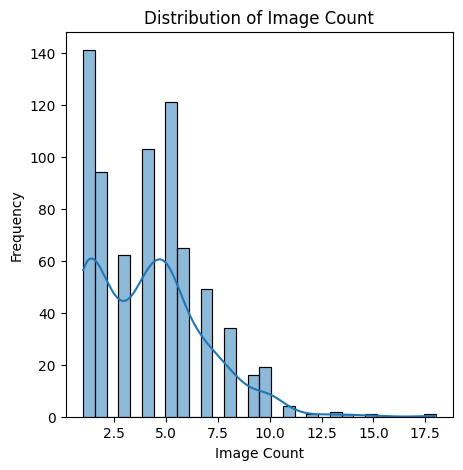

In [ ]:
for col in continuous_columns:
    plt.figure(figsize=(5, 5))
    sns.histplot(df2[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

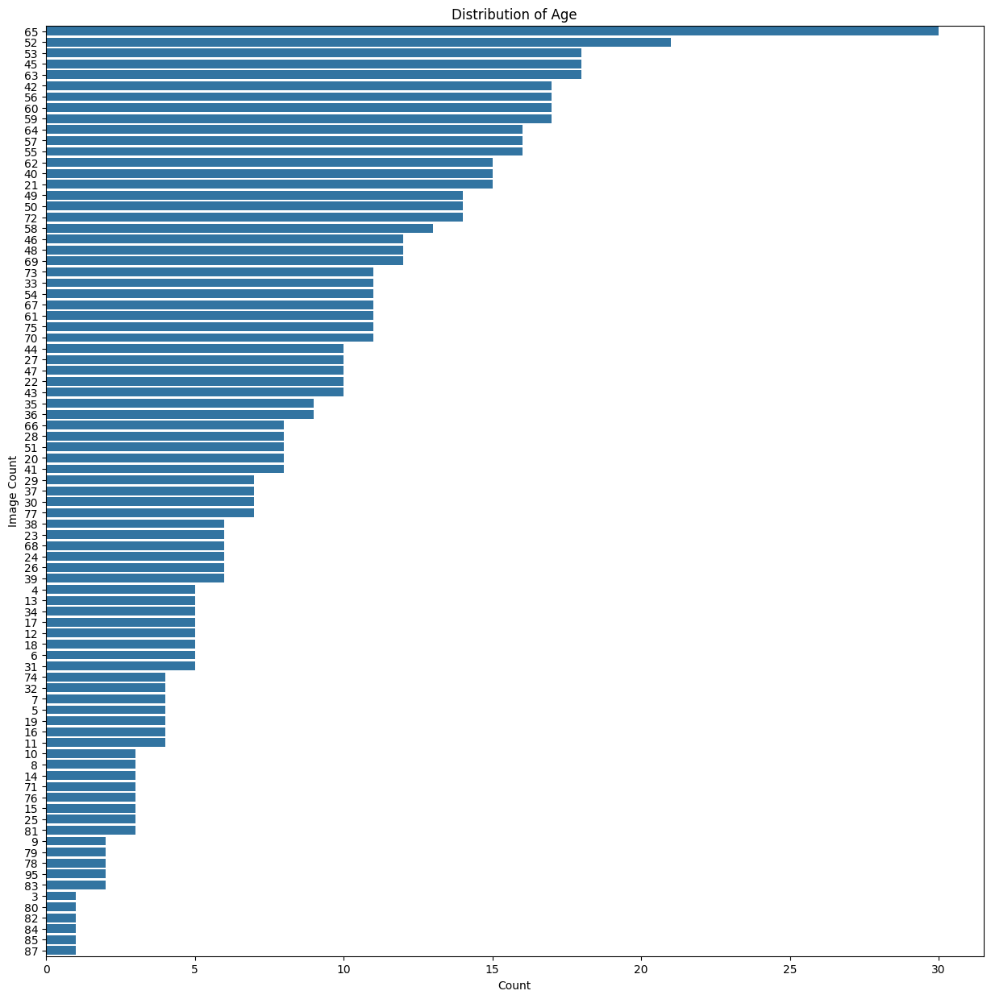

In [ ]:
plt.figure(figsize=(15,15))
sns.countplot(y=df2[categorical_columns[0]], order=df2 [categorical_columns[0]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[0]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

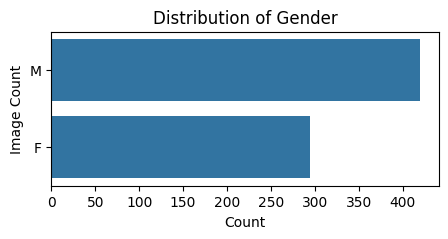

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[1]], order=df2 [categorical_columns[1]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[1]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

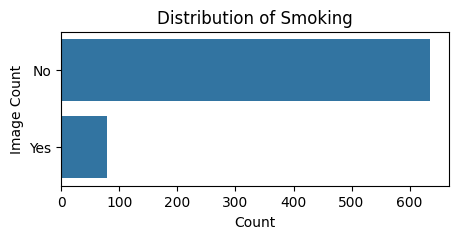

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[2]], order=df2 [categorical_columns[2]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[2]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

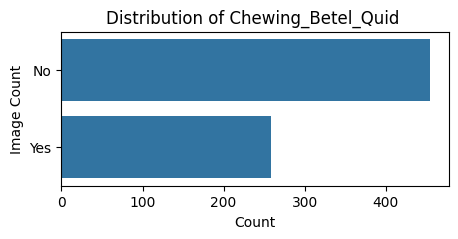

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[3]], order=df2 [categorical_columns[3]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[3]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

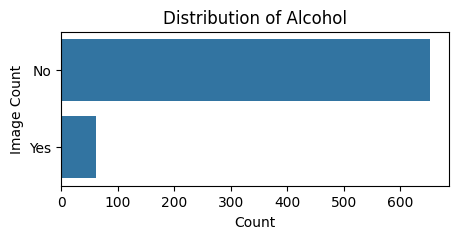

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[4]], order=df2 [categorical_columns[4]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[4]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

---

#### Annotations

##### Load and Explore the Annotation JSON

In [ ]:
print("Loading annotation file...")
with open(ANNOTATION_FILE, 'r') as f:
    annotations = json.load(f)

print(f"Top-level keys in JSON: {annotations.keys()}")

Loading annotation file...
Top-level keys in JSON: dict_keys(['images', 'annotations', 'categories'])


In [ ]:
# Common keys in annotation formats:
# COCO: ['images', 'annotations', 'categories']

images_info      = annotations['images']
annotations_info = annotations['annotations']
categories_info  = annotations['categories']

print(f"Number of images: {len(images_info)}")
print(f"Number of annotations: {len(annotations_info)}")

Number of images: 3000
Number of annotations: 6358


In [ ]:
print("First image info:", images_info[0])

First image info: {'id': 1, 'file_name': 'R-01-01.jpg'}


In [ ]:
print(f"Categories: {categories_info}")

Categories: [{'id': 1, 'name': 'Lesion', 'supercategory': 'object'}, {'id': 2, 'name': 'Oral Cavity', 'supercategory': 'object'}]


In [ ]:
print("First annotation info:", annotations_info[0])

First annotation info: {'id': 1, 'image_id': 1, 'category_id': 1, 'bbox': [2574, 1739, 464, 562], 'segmentation': [2574, 1845, 2848, 1739, 3038, 2088, 2977, 2255, 2908, 2301, 2673, 2058], 'area': 6990438, 'iscrowd': 0}


In [ ]:
# Create a DataFrame to Link Everything
# Build a list of image data
image_data = []
for img_info in images_info:
    image_id = img_info['id']
    file_name = img_info['file_name']

    image_path = os.path.join(IMAGE_DIR, file_name)

    if not os.path.exists(image_path):
        print(f"Warning: Image file not found: {image_path}. Skipping.")
        continue

    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

    if img is None:
        print(f"Warning: Could not read image: {image_path}. Skipping.")
        continue

    height, width = img.shape[:2]

    image_data.append({
        'image_id': image_id,
        'file_name': file_name,
        'width': width,
        'height': height,
        'image_path': image_path # Store the full path
    })

df_images = pd.DataFrame(image_data)

if df_images.empty:
    raise ValueError("No valid images were found! Please check IMAGE_DIR path.")

In [ ]:
df_images.head()

,image_id,file_name,width,height,image_path
0,1,R-01-01.jpg,4608,3456,Images/R-01-01.jpg
1,2,R-01-02.jpg,4608,3456,Images/R-01-02.jpg
2,3,R-01-03.jpg,3456,4608,Images/R-01-03.jpg
3,4,R-02-01.jpg,4608,3456,Images/R-02-01.jpg
4,5,R-02-02.jpg,4608,3456,Images/R-02-02.jpg


In [ ]:
# Build a list of annotation data
annotation_data = []
for ann_info in annotations_info:
    annotation_data.append({
        'image_id': ann_info['image_id'],
        'category_id': ann_info['category_id'],
        'segmentation': ann_info['segmentation'],
        'area': ann_info['area'],
        'iscrowd': ann_info['iscrowd']
    })

df_annotations = pd.DataFrame(annotation_data)

In [ ]:
df_annotations.head()

,image_id,category_id,segmentation,area,iscrowd
0,1,1,"[2574, 1845, 2848, 1739, 3038, 2088, 2977, 225...",6990438,0
1,1,2,"[2125, 34, 1437, 439, 981, 1050, 860, 2039, 10...",15815990,0
2,2,2,"[318, 52, 310, 731, 620, 1704, 757, 2263, 800,...",15815990,0
3,2,1,"[3948, 1399, 3767, 1162, 3728, 1090, 3612, 110...",7041375,0
4,3,2,"[19, 1187, 19, 1755, 232, 2336, 439, 2949, 490...",10090416,0


In [ ]:
df = pd.merge(df_images, df_annotations, on='image_id', how='left')

In [ ]:
print(f"Merged DataFrame shape: {df.shape}\n")
df.head()

Merged DataFrame shape: (6358, 9)



,image_id,file_name,width,height,image_path,category_id,segmentation,area,iscrowd
0,1,R-01-01.jpg,4608,3456,Images/R-01-01.jpg,1,"[2574, 1845, 2848, 1739, 3038, 2088, 2977, 225...",6990438,0
1,1,R-01-01.jpg,4608,3456,Images/R-01-01.jpg,2,"[2125, 34, 1437, 439, 981, 1050, 860, 2039, 10...",15815990,0
2,2,R-01-02.jpg,4608,3456,Images/R-01-02.jpg,2,"[318, 52, 310, 731, 620, 1704, 757, 2263, 800,...",15815990,0
3,2,R-01-02.jpg,4608,3456,Images/R-01-02.jpg,1,"[3948, 1399, 3767, 1162, 3728, 1090, 3612, 110...",7041375,0
4,3,R-01-03.jpg,3456,4608,Images/R-01-03.jpg,2,"[19, 1187, 19, 1755, 232, 2336, 439, 2949, 490...",10090416,0


In [ ]:
# Check for images without annotations
missing_annotations = df['segmentation'].isnull().sum()
print(f"Number of images with missing annotations: {missing_annotations}")
if missing_annotations > 0:
    print("Dropping images with missing annotations...")
    df = df.dropna(subset=['segmentation']).copy()
    print(f"DataFrame shape after dropping: {df.shape}")

Number of images with missing annotations: 0


In [ ]:
# Load data
with open(ANNOTATION_FILE, 'r') as f:
    annotations = json.load(f)

df_imagewise_meta = pd.read_excel(IMAGEWISE_METADATA_FILE)

# Create necessary mappings
image_annotations_map = {}
for ann in annotations['annotations']:
    image_id = ann['image_id']
    if image_id not in image_annotations_map:
        image_annotations_map[image_id] = []
    image_annotations_map[image_id].append(ann)

file_to_image_map = {}
for img in annotations['images']:
    file_to_image_map[img['file_name']] = img

category_map = {cat['id']: cat['name'] for cat in annotations['categories']}

In [ ]:
# -------------------------------------------------------------------
# FUNCTION 1: Get Image IDs by Category
# -------------------------------------------------------------------
def get_images_by_category(category_value, category_column='Category',
                          diagnosis_column='Clinical Diagnosis', max_samples=10):
    """
    Get image IDs and metadata for images belonging to a specific category.
    """

    print(f"Looking for category: '{category_value}' in column: '{category_column}'")
    print(f"Available columns in metadata: {df_imagewise_meta.columns.tolist()}")

    # Create a mapping from filename without extension to metadata row
    metadata_map = {}
    for idx, row in df_imagewise_meta.iterrows():
        image_name = row['Image Name']
        # Remove .jpg if present, and also handle case where it might not be present
        image_name_clean = image_name.replace('.jpg', '').replace('.jpeg', '').replace('.png', '')
        metadata_map[image_name_clean] = row

    # Merge image data with metadata
    image_data = []
    matched_count = 0
    unmatched_count = 0

    for img in annotations['images']:
        file_name = img['file_name']  # This has .jpg extension (e.g., 'R-01-01.jpg')
        image_id = img['id']

        # Clean the filename for matching (remove extension)
        file_name_clean = file_name.replace('.jpg', '').replace('.jpeg', '').replace('.png', '')

        # Get metadata for this image
        category = "Unknown"
        diagnosis = "Unknown"

        if file_name_clean in metadata_map:
            meta_row = metadata_map[file_name_clean]
            matched_count += 1

            if category_column in meta_row.index:
                category = meta_row[category_column]
                if pd.isna(category):  # Handle NaN values
                    category = "Unknown"
            if diagnosis_column in meta_row.index:
                diagnosis = meta_row[diagnosis_column]
                if pd.isna(diagnosis):  # Handle NaN values
                    diagnosis = "Unknown"
        else:
            unmatched_count += 1
            # Uncomment the line below if you want to see which files aren't matching
            # print(f"No metadata found for image: {file_name} (searched as: {file_name_clean})")

        image_data.append({
            'image_id': image_id,
            'file_name': file_name,  # Keep original filename with extension for image loading
            'file_name_clean': file_name_clean,  # Clean version for reference
            'category': category,
            'diagnosis': diagnosis
        })

    print(f"Metadata matching: {matched_count} matched, {unmatched_count} unmatched")

    df_images_meta = pd.DataFrame(image_data)

    # Check what categories we have
    available_categories = df_images_meta['category'].unique()  # Use lowercase 'category'
    print(f"Available categories: {available_categories}")

    # Filter by category - use the correct column name from our created dataframe
    filtered_images = df_images_meta[df_images_meta['category'] == category_value]

    if filtered_images.empty:
        print(f"No images found for category: '{category_value}'")
        print(f"Available categories: {available_categories}")
        return []

    # Sample if there are too many images
    if len(filtered_images) > max_samples:
        filtered_images = filtered_images.sample(n=max_samples, random_state=42)
        print(f"Sampled {max_samples} images out of {len(filtered_images)} total for category '{category_value}'")
    else:
        print(f"Found {len(filtered_images)} images for category '{category_value}'")

    # Convert to list of dictionaries for easy processing
    result = filtered_images.to_dict('records')

    return result

In [ ]:
# -------------------------------------------------------------------
# FUNCTION 2: Visualize Annotations for Specific Image IDs
# -------------------------------------------------------------------
def visualize_annotations_for_images(image_list, category_value,
                                   category_colors=None,
                                   figsize=(15, 10)):
    """
    Visualize annotations for a list of images.

    Args:
        image_list (list): List of image metadata dictionaries from get_images_by_category()
        category_value (str): The category value being visualized (for title)
        category_colors (dict): Color mapping for annotation categories
        figsize (tuple): Figure size for the plot
    """

    if not image_list:
        print("No images to visualize.")
        return

    # Default colors for annotation categories
    if category_colors is None:
        category_colors = {
            1: 'red',      # Lesion - Red
            2: 'cyan'      # Oral Cavity - Cyan
        }

    num_images = len(image_list)
    cols = min(3, num_images)  # Maximum 3 columns
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Handle single image case
    if num_images == 1:
        axes = np.array([axes])
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)

    axes = axes.ravel()

    for i, image_info in enumerate(image_list):
        if i >= len(axes):
            break

        image_id = image_info['image_id']
        file_name = image_info['file_name']
        category = image_info['category']
        diagnosis = image_info['diagnosis']

        # Load and display the image
        image_path = os.path.join(IMAGE_DIR, file_name)
        image = cv2.imread(image_path)

        if image is None:
            print(f"Could not load image: {image_path}")
            axes[i].text(0.5, 0.5, f"Image not found:\n{file_name}",
                        ha='center', va='center', transform=axes[i].transAxes)
            axes[i].axis('off')
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[i].imshow(image)

        # Create title with image information
        title_parts = [f"ID: {image_id}", f"File: {file_name}"]
        if diagnosis != "Unknown":
            title_parts.append(f"Diagnosis: {diagnosis}")
        if category != "Unknown":
            title_parts.append(f"Category: {category}")

        axes[i].set_title('\n'.join(title_parts), fontsize=10, pad=10)

        # Draw annotations if they exist
        if image_id in image_annotations_map:
            annotations_list = image_annotations_map[image_id]

            legend_handles = []
            legend_labels = []

            for ann in annotations_list:
                category_id = ann['category_id']
                category_name = category_map.get(category_id, f'Class {category_id}')
                polygon_points = ann['segmentation']

                if not isinstance(polygon_points, list) or len(polygon_points) < 6:
                    continue

                # Reshape polygon points
                pts = np.array(polygon_points, dtype=np.float32).reshape((-1, 2))

                # Get color for this category
                color = category_colors.get(category_id, 'yellow')

                # Create polygon patch
                polygon = Polygon(pts, closed=True, fill=False,
                                edgecolor=color, linewidth=2.5, linestyle='-',
                                label=category_name)

                # Add to plot
                axes[i].add_patch(polygon)

                # Add to legend if not already present
                if category_name not in legend_labels:
                    legend_handles.append(polygon)
                    legend_labels.append(category_name)

            # Add legend if we have annotations
            if legend_handles:
                axes[i].legend(legend_handles, legend_labels, loc='upper right', fontsize=8)
        else:
            axes[i].text(0.5, 0.5, "No annotations",
                        ha='center', va='center', transform=axes[i].transAxes,
                        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))

        axes[i].axis('off')

    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Main title
    plt.suptitle(f'Annotations for Category: {category_value}\n'
                 f'Red: Lesion, Cyan: Oral Cavity',
                 fontsize=14, fontweight='bold', y=0.95)

    plt.tight_layout()
    plt.show()

    # Print summary
    print(f"\nVisualized {min(len(image_list), len(axes))} images for category: {category_value}")
    for image_info in image_list:
        image_id = image_info['image_id']
        if image_id in image_annotations_map:
            ann_count = len(image_annotations_map[image_id])
            lesion_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 1)
            oral_cavity_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 2)
            print(f"  Image {image_id}: {ann_count} annotations ({lesion_count} lesions, {oral_cavity_count} oral cavities)")

In [ ]:
# -------------------------------------------------------------------
# FUNCTION 2: Visualize Annotations for Specific Image IDs
# -------------------------------------------------------------------
def visualize_annotations_for_images(image_list, category_value,
                                   category_colors=None,
                                   figsize=(15, 10)):
    """
    Visualize annotations for a list of images.
    """

    if not image_list:
        print("No images to visualize.")
        return

    # Default colors for annotation categories
    if category_colors is None:
        category_colors = {
            1: 'red',      # Lesion - Red
            2: 'cyan'      # Oral Cavity - Cyan
        }

    num_images = len(image_list)
    cols = min(3, num_images)  # Maximum 3 columns
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Handle single image case
    if num_images == 1:
        axes = np.array([axes])
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)

    axes = axes.ravel()

    for i, image_info in enumerate(image_list):
        if i >= len(axes):
            break

        image_id = image_info['image_id']
        file_name = image_info['file_name']
        category = image_info['category']
        diagnosis = image_info['diagnosis']

        # Load and display the image
        image_path = os.path.join(IMAGE_DIR, file_name)
        image = cv2.imread(image_path)

        if image is None:
            print(f"Could not load image: {image_path}")
            axes[i].text(0.5, 0.5, f"Image not found:\n{file_name}",
                        ha='center', va='center', transform=axes[i].transAxes)
            axes[i].axis('off')
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[i].imshow(image)

        # Create title with image information
        title_parts = [f"ID: {image_id}", f"File: {file_name}"]
        if diagnosis != "Unknown":
            title_parts.append(f"Diagnosis: {diagnosis}")
        if category != "Unknown":
            title_parts.append(f"Category: {category}")

        axes[i].set_title('\n'.join(title_parts), fontsize=10, pad=10)

        # Draw annotations if they exist
        if image_id in image_annotations_map:
            annotations_list = image_annotations_map[image_id]

            legend_handles = []
            legend_labels = []

            for ann in annotations_list:
                category_id = ann['category_id']
                category_name = category_map.get(category_id, f'Class {category_id}')
                polygon_points = ann['segmentation']

                if not isinstance(polygon_points, list) or len(polygon_points) < 6:
                    continue

                # Reshape polygon points
                pts = np.array(polygon_points, dtype=np.float32).reshape((-1, 2))

                # Get color for this category
                color = category_colors.get(category_id, 'yellow')

                # Create polygon patch
                polygon = Polygon(pts, closed=True, fill=False,
                                edgecolor=color, linewidth=2.5, linestyle='-',
                                label=category_name)

                # Add to plot
                axes[i].add_patch(polygon)

                # Add to legend if not already present
                if category_name not in legend_labels:
                    legend_handles.append(polygon)
                    legend_labels.append(category_name)

            # Add legend if we have annotations
            if legend_handles:
                axes[i].legend(legend_handles, legend_labels, loc='upper right', fontsize=8)
        else:
            axes[i].text(0.5, 0.5, "No annotations",
                        ha='center', va='center', transform=axes[i].transAxes,
                        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))

        axes[i].axis('off')

    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Main title
    plt.suptitle(f'Annotations for Category: {category_value}\n'
                 f'Red: Lesion, Cyan: Oral Cavity\n\n',
                 fontsize=14, fontweight='bold', y=0.95)

    plt.tight_layout()
    plt.show()

    # Print summary
    print(f"\nVisualized {min(len(image_list), len(axes))} images for category: {category_value}")
    for image_info in image_list:
        image_id = image_info['image_id']
        if image_id in image_annotations_map:
            ann_count = len(image_annotations_map[image_id])
            lesion_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 1)
            oral_cavity_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 2)
            print(f"  Image {image_id}: {ann_count} annotations ({lesion_count} lesions, {oral_cavity_count} oral cavities)")

In [ ]:
# -------------------------------------------------------------------
# EXPLORE AVAILABLE CATEGORIES
# -------------------------------------------------------------------
def explore_available_categories():
    """First, let's see what categories and values are available"""
    print("=== EXPLORING AVAILABLE DATA ===")
    print("Columns in metadata file:", df_imagewise_meta.columns.tolist())

    # Check unique values in Category column
    if 'Category' in df_imagewise_meta.columns:
        print("\nUnique values in 'Category' column:")
        category_counts = df_imagewise_meta['Category'].value_counts()
        print(category_counts)

        # Show the actual values (in case there are spaces or case differences)
        print("\nActual category values:")
        for category in df_imagewise_meta['Category'].unique():
            print(f"  '{category}'")

    # Check sample rows
    print("\nSample of metadata (first 5 rows):")
    print(df_imagewise_meta[['Image Name', 'Category', 'Clinical Diagnosis']].head(10))

# Run exploration
explore_available_categories()

=== EXPLORING AVAILABLE DATA ===
Columns in metadata file: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']

Unique values in 'Category' column:
Category
OPMD       1394
Benign      748
Healthy     729
OCA         129
Name: count, dtype: int64

Actual category values:
  'OPMD'
  'Benign'
  'Healthy'
  'OCA'

Sample of metadata (first 5 rows):
  Image Name Category Clinical Diagnosis
0    R-01-01     OPMD        Leukoplakia
1    R-01-02     OPMD        Leukoplakia
2    R-01-03   Benign      Coated Tongue
3    R-02-01   Benign                VBD
4    R-02-02   Benign                VBD
5    R-02-03   Benign                VBD
6    R-02-04   Benign                VBD
7    R-02-05  Healthy      Normal Mucosa
8    R-02-06  Healthy      Normal Mucosa
9    R-02-07  Healthy      Normal Mucosa


Looking for category: 'OPMD' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'OPMD'
Successfully found images for category: 'OPMD'


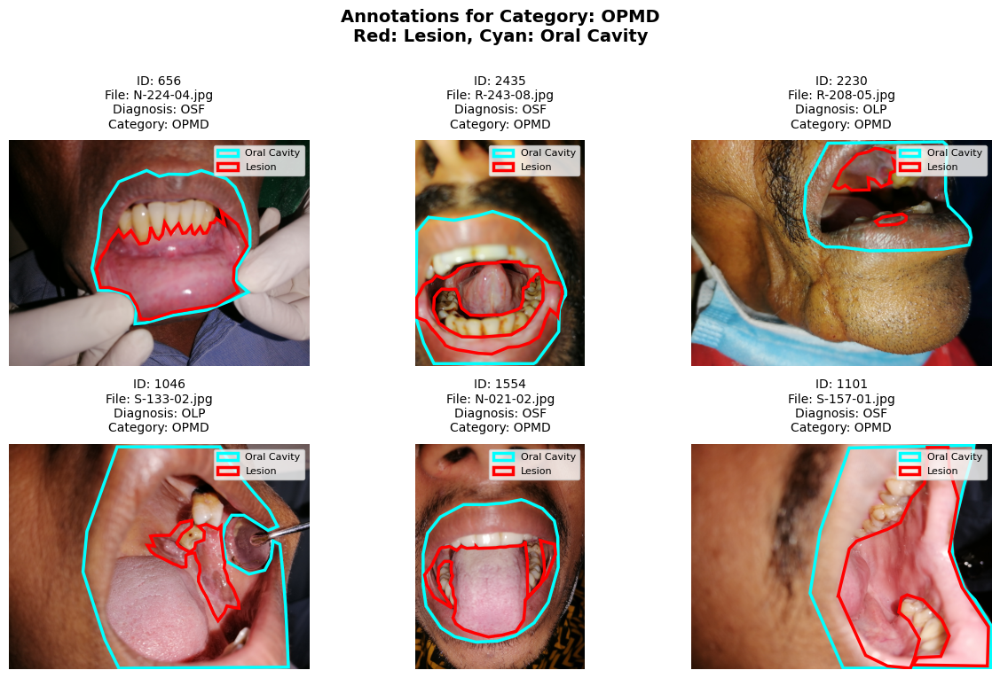


Visualized 6 images for category: OPMD
  Image 656: 2 annotations (1 lesions, 1 oral cavities)
  Image 2435: 2 annotations (1 lesions, 1 oral cavities)
  Image 2230: 3 annotations (2 lesions, 1 oral cavities)
  Image 1046: 2 annotations (1 lesions, 1 oral cavities)
  Image 1554: 2 annotations (1 lesions, 1 oral cavities)
  Image 1101: 2 annotations (1 lesions, 1 oral cavities)


In [ ]:
category ='OPMD'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

Looking for category: 'Benign' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'Benign'
Successfully found images for category: 'Benign'


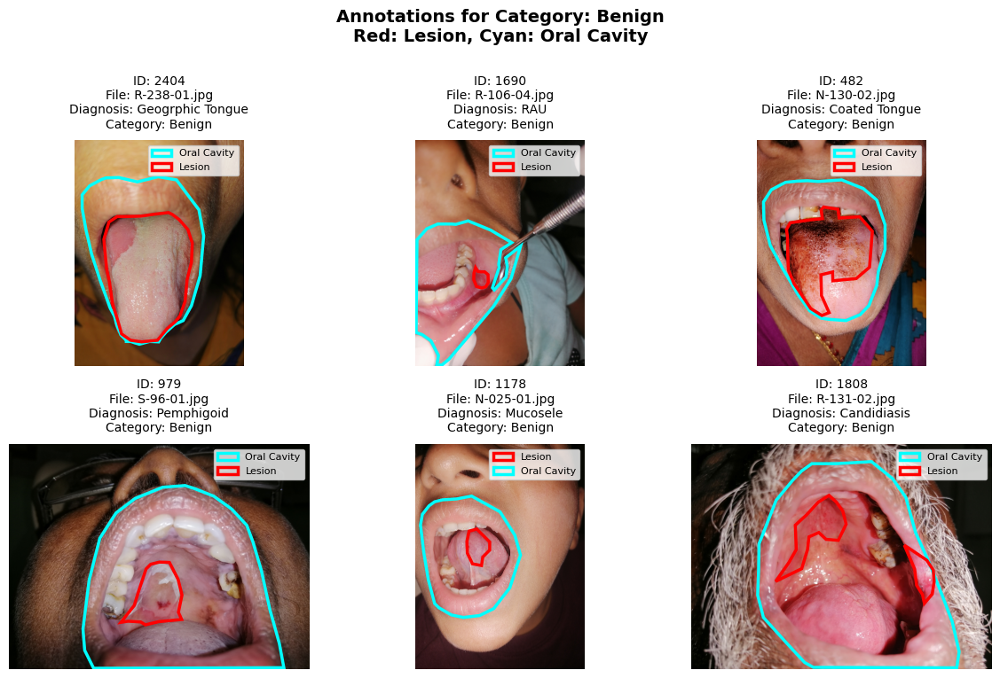


Visualized 6 images for category: Benign
  Image 2404: 2 annotations (1 lesions, 1 oral cavities)
  Image 1690: 2 annotations (1 lesions, 1 oral cavities)
  Image 482: 2 annotations (1 lesions, 1 oral cavities)
  Image 979: 2 annotations (1 lesions, 1 oral cavities)
  Image 1178: 2 annotations (1 lesions, 1 oral cavities)
  Image 1808: 3 annotations (2 lesions, 1 oral cavities)


In [ ]:
category ='Benign'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

Looking for category: 'Healthy' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'Healthy'
Successfully found images for category: 'Healthy'


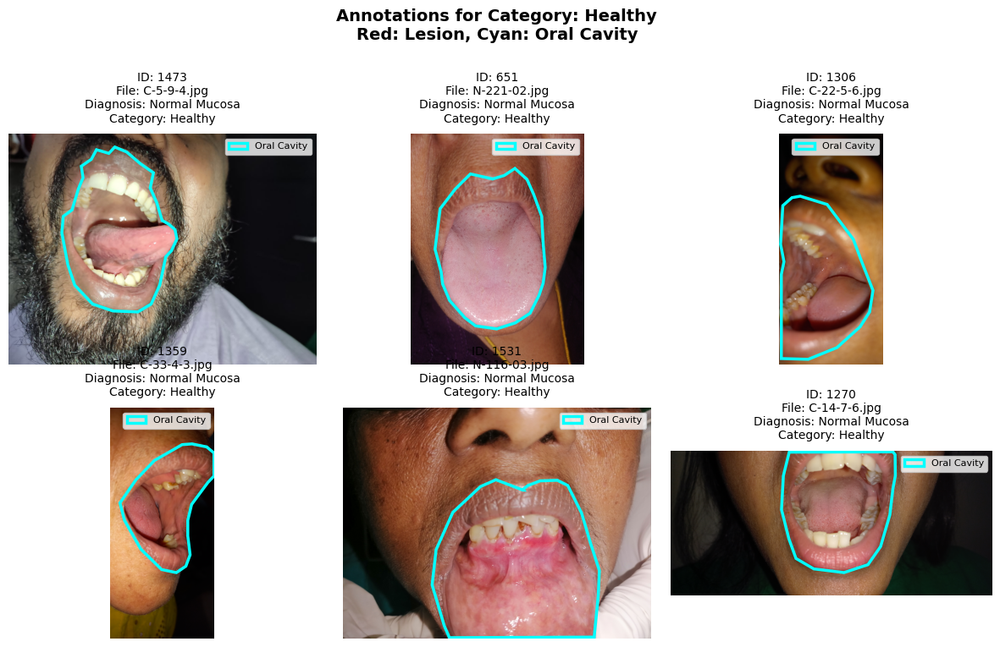


Visualized 6 images for category: Healthy
  Image 1473: 1 annotations (0 lesions, 1 oral cavities)
  Image 651: 1 annotations (0 lesions, 1 oral cavities)
  Image 1306: 1 annotations (0 lesions, 1 oral cavities)
  Image 1359: 1 annotations (0 lesions, 1 oral cavities)
  Image 1531: 1 annotations (0 lesions, 1 oral cavities)
  Image 1270: 1 annotations (0 lesions, 1 oral cavities)


In [ ]:
category ='Healthy'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

Looking for category: 'OCA' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'OCA'
Successfully found images for category: 'OCA'


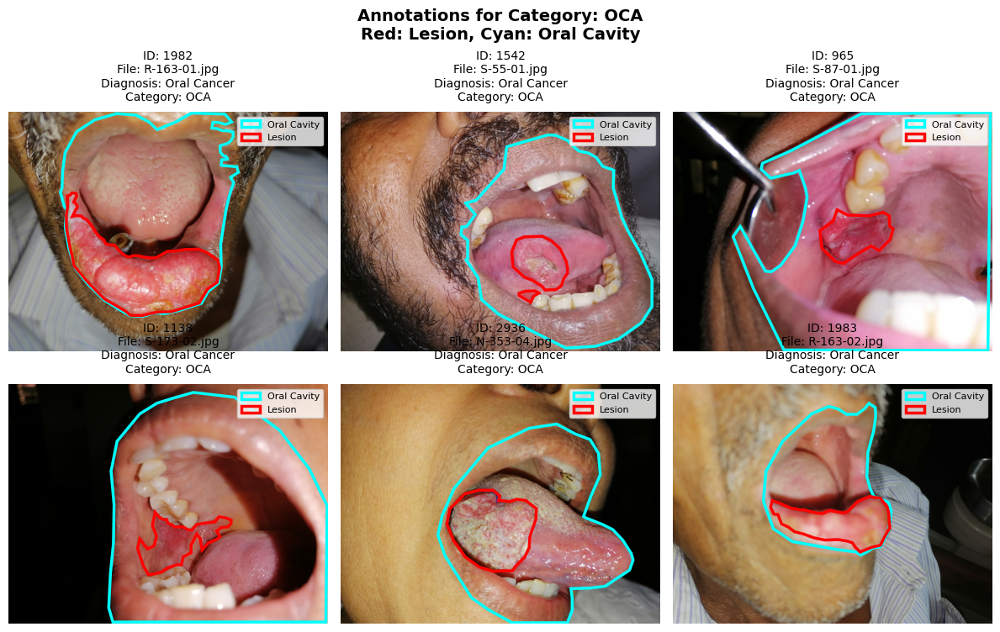


Visualized 6 images for category: OCA
  Image 1982: 2 annotations (1 lesions, 1 oral cavities)
  Image 1542: 3 annotations (2 lesions, 1 oral cavities)
  Image 965: 2 annotations (1 lesions, 1 oral cavities)
  Image 1138: 2 annotations (1 lesions, 1 oral cavities)
  Image 2936: 2 annotations (1 lesions, 1 oral cavities)
  Image 1983: 2 annotations (1 lesions, 1 oral cavities)


In [ ]:
category ='OCA'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

---

#### Removing "Benign" and "OSF" images from the Image folder

In [ ]:
#### Moving "Benign" images into a different folder

# --- Configuration ---
BENIGN_IMAGES_DIR = os.path.join(DATA_DIR, "Benign")

# Create benign images directory
os.makedirs(BENIGN_IMAGES_DIR, exist_ok=True)

# Load the imagewise data
df = pd.read_excel(IMAGEWISE_METADATA_FILE)

# Filter for Benign images
benign_images = df[df['Category'] == 'Benign']

print(f"Found {len(benign_images)} Benign images")

# Move Benign images to the new folder
moved_count = 0
error_count = 0

for index, row in benign_images.iterrows():
    try:
        image_name = row['Image Name']
        # Add .jpg extension if not present
        if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_name += '.jpg'

        source_path = os.path.join(IMAGE_DIR, image_name)
        destination_path = os.path.join(BENIGN_IMAGES_DIR, image_name)

        # Check if source file exists
        if os.path.exists(source_path):
            # MOVE the file
            shutil.move(source_path, destination_path)
            moved_count += 1
            print(f" Moved: {image_name}")
        else:
            print(f" File not found: {image_name}")
            error_count += 1

    except Exception as e:
        print(f" Error moving {row['Image Name']}: {e}")
        error_count += 1

print(f"\n{'='*50}")
print(f"MOVING COMPLETED!")
print(f"{'='*50}")
print(f"Successfully moved: {moved_count} images")
print(f"Errors: {error_count} images")
print(f"Benign images moved to: {BENIGN_IMAGES_DIR}")

Found 748 Benign images
 Moved: R-01-03.jpg
 Moved: R-02-01.jpg
 Moved: R-02-02.jpg
 Moved: R-02-03.jpg
 Moved: R-02-04.jpg
 Moved: R-03-02.jpg
 Moved: R-03-03.jpg
 Moved: R-03-04.jpg
 Moved: R-04-01.jpg
 Moved: R-04-02.jpg
 Moved: R-06-01.jpg
 Moved: R-06-02.jpg
 Moved: R-06-03.jpg
 Moved: R-11-02.jpg
 Moved: R-11-03.jpg
 Moved: R-11-04.jpg
 Moved: R-13-04.jpg
 Moved: R-14-01.jpg
 Moved: R-19-01.jpg
 Moved: R-22-02.jpg
 Moved: R-22-03.jpg
 Moved: R-22-04.jpg
 Moved: R-23-01.jpg
 Moved: R-23-03.jpg
 Moved: R-23-04.jpg
 Moved: R-23-05.jpg
 Moved: R-29-01.jpg
 Moved: R-29-03.jpg
 Moved: R-29-04.jpg
 Moved: R-30-01.jpg
 Moved: R-31-01.jpg
 Moved: R-31-02.jpg
 Moved: R-32-01.jpg
 Moved: R-32-03.jpg
 Moved: R-33-01.jpg
 Moved: R-33-02.jpg
 Moved: R-36-01.jpg
 Moved: R-36-02.jpg
 Moved: R-36-03.jpg
 Moved: R-36-04.jpg
 Moved: R-39-01.jpg
 Moved: R-40-01.jpg
 Moved: R-40-02.jpg
 Moved: R-42-01.jpg
 Moved: R-42-02.jpg
 Moved: R-42-03.jpg
 Moved: R-42-04.jpg
 Moved: R-42-05.jpg
 Moved: R-42-06.

In [ ]:
filelist = os.listdir(IMAGE_DIR)
print(len(filelist))

2252


In [ ]:
#### Moving "OSF" images into a different folder

# --- Configuration ---
OSF_IMAGES_DIR = os.path.join(DATA_DIR, "OSF")

# Create OSF images directory
os.makedirs(OSF_IMAGES_DIR, exist_ok=True)

# Load the imagewise data
df = pd.read_excel(IMAGEWISE_METADATA_FILE)

# Filter for OSF images
OSF_images = df[df['Clinical Diagnosis'] == 'OSF']

print(f"Found {len(OSF_images)} OSF images")

# Move OSF images to the new folder
moved_count = 0
error_count = 0

for index, row in OSF_images.iterrows():
    try:
        image_name = row['Image Name']
        # Add .jpg extension if not present (adjust if your images have different extensions)
        if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_name += '.jpg'

        source_path = os.path.join(IMAGE_DIR, image_name)
        destination_path = os.path.join(OSF_IMAGES_DIR, image_name)

        # Check if source file exists
        if os.path.exists(source_path):
            # MOVE the file
            shutil.move(source_path, destination_path)
            moved_count += 1
            print(f" Moved: {image_name}")
        else:
            print(f" File not found: {image_name}")
            error_count += 1

    except Exception as e:
        print(f" Error moving {row['Image Name']}: {e}")
        error_count += 1

print(f"\n{'='*50}")
print(f"MOVING COMPLETED!")
print(f"{'='*50}")
print(f"Successfully moved: {moved_count} images")
print(f"Errors: {error_count} images")
print(f"OSF images moved to: {OSF_IMAGES_DIR}")

Found 684 OSF images
 Moved: R-09-01.jpg
 Moved: R-09-02.jpg
 Moved: R-09-03.jpg
 Moved: R-09-04.jpg
 Moved: R-09-05.jpg
 Moved: R-09-06.jpg
 Moved: R-09-07.jpg
 Moved: R-09-08.jpg
 Moved: R-09-09.jpg
 Moved: R-10-02.jpg
 Moved: R-10-03.jpg
 Moved: R-12-01.jpg
 Moved: R-12-02.jpg
 Moved: R-12-03.jpg
 Moved: R-17-01.jpg
 Moved: R-17-02.jpg
 Moved: R-17-03.jpg
 Moved: R-17-04.jpg
 Moved: R-17-05.jpg
 Moved: R-21-01.jpg
 Moved: R-21-02.jpg
 Moved: R-21-03.jpg
 Moved: R-21-04.jpg
 Moved: R-21-05.jpg
 Moved: R-21-06.jpg
 Moved: R-21-07.jpg
 Moved: R-24-01.jpg
 Moved: R-24-02.jpg
 Moved: R-24-03.jpg
 Moved: R-24-04.jpg
 Moved: R-24-05.jpg
 Moved: R-24-06.jpg
 Moved: R-24-07.jpg
 Moved: R-34-01.jpg
 Moved: R-34-02.jpg
 Moved: R-34-04.jpg
 Moved: R-45-02.jpg
 Moved: R-45-04.jpg
 Moved: R-52-01.jpg
 Moved: R-52-02.jpg
 Moved: R-52-03.jpg
 Moved: R-52-04.jpg
 Moved: R-52-05.jpg
 Moved: R-52-06.jpg
 Moved: R-56-01.jpg
 Moved: R-56-02.jpg
 Moved: R-56-03.jpg
 Moved: R-56-04.jpg
 Moved: R-56-05.jpg

In [ ]:
filelist = os.listdir(IMAGE_DIR)
print(len(filelist))

1568


---

#### Data Preparation and Preprocessing

In [ ]:
def get_image_size_stats(image_dir):
  heights, widths = [], []

  for filename in os.listdir(image_dir):
    if filename.lower().endswith(('.jpg','.jpeg','.png','.bmp')):
      path = os.path.join(image_dir, filename)
      try:
        img = Image.open(path)
        w,h = img.size
        widths.append(w)
        heights.append(h)
      except Exception as e:
        print(f"Skipping {filename}:{e}")
        continue

  print(f"Number of images scanned: {len(heights)}")
  print(f"Height: min= {min(heights)}, max={max(heights)}")
  print(f"Width: min={min(widths)}, max={max(widths)}")

In [ ]:
get_image_size_stats(IMAGE_DIR)

Number of images scanned: 1568
Height: min= 960, max=4608
Width: min=654, max=4608


In [ ]:
df1 = pd.read_excel(IMAGEWISE_METADATA_FILE)
print(f"Original data shape:",{df1.shape})

Original data shape: {(3000, 4)}


In [ ]:
# Filter only the train images
train_images = set([f for f in os.listdir(IMAGE_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
df_cleaned   = df1[df1['Image Name'].apply(lambda x: x in train_images or
                                      any(x + ext in train_images for ext in ['.jpg', '.jpeg', '.png']))]

print(f"Total images for classification: {len(df_cleaned)}")

Total images for classification: 1568


In [ ]:
df_cleaned.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
7,R-02-05,Healthy,Normal Mucosa,0
8,R-02-06,Healthy,Normal Mucosa,0
9,R-02-07,Healthy,Normal Mucosa,0


In [ ]:
df_cleaned = df_cleaned.reset_index(drop=True)

In [ ]:
df_cleaned.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
2,R-02-05,Healthy,Normal Mucosa,0
3,R-02-06,Healthy,Normal Mucosa,0
4,R-02-07,Healthy,Normal Mucosa,0


In [ ]:
len(df_cleaned)

1568

In [ ]:
df_cleaned.to_excel(os.path.join(DATA_DIR,'Imagewise_Data_cleaned.xlsx'), index=False)
print("DataFrame saved as 'Imagewise_Data_cleaned.xlsx'")

DataFrame saved as 'Imagewise_Data_cleaned.xlsx'


In [ ]:
print("Count of each Category in the dataset:\n")
category_counts = df_cleaned['Category'].value_counts()
print(category_counts)

Count of each Category in the dataset:

Category
Healthy    729
OPMD       710
OCA        129
Name: count, dtype: int64


In [ ]:
print("Percentage of each Category in the dataset:\n")
print((df_cleaned['Category'].value_counts()/df_cleaned['Category'].value_counts().sum())*100)
print("\nImbalance Ratio:", df_cleaned['Category'].value_counts().max()/ df_cleaned['Category'].value_counts().min())

Percentage of each Category in the dataset:

Category
Healthy    46.492347
OPMD       45.280612
OCA         8.227041
Name: count, dtype: float64

Imbalance Ratio: 5.651162790697675


* From the above results it is clear that the dataset is imbalanced (Imbalance Ratio: ~ 6:1)
* To address this we can use data augmentation or loss functions like "Focal Loss", "Weighted Cross Entropy Loss"

In [ ]:
print("\nClinical Diagnosis distribution:")
diagnosis_counts = df_cleaned['Clinical Diagnosis'].value_counts()
print(diagnosis_counts)


Clinical Diagnosis distribution:
Clinical Diagnosis
Normal Mucosa                         727
OLP                                   358
Oral Cancer                           125
OLP/LR                                 78
Leukoplakia                            69
OLP/ LR                                40
Leukplakia                             19
Erythroplakia                          14
PVL                                    14
Leukoplakia + OSF                      12
OLP /LR                                11
OLP/ PVL                                9
Early OSF                               9
OLP/DLE                                 9
Leukplakia + OSF                        7
Leukoplakia/ Candidiasis                6
Homogenous Leukoplakia                  6
Erythroleukoplakia                      5
Non-Homogenous Leukoplia                4
Erythroplakia + OSF                     4
Erythroplkia                            3
OLP + Coated Tongue                     3
OLP (Erosive)          

In [ ]:
print("Clinical Diagnosis types in the Dataset:")
print(len(df_cleaned['Clinical Diagnosis'].unique()))

Clinical Diagnosis types in the Dataset:
47


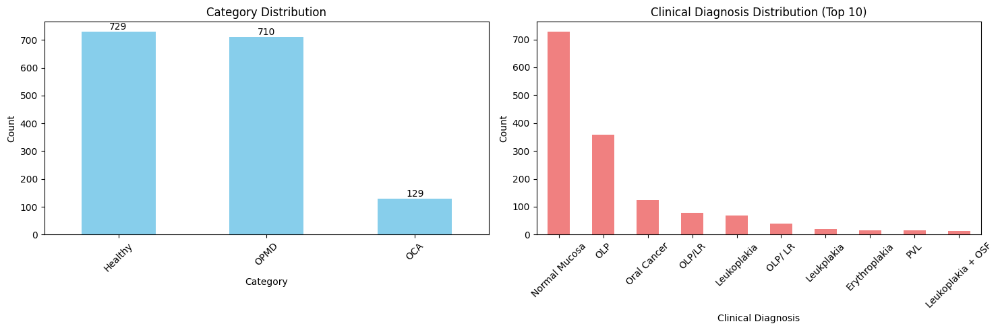

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))

# category distribution
category_counts.plot(kind='bar', ax=ax1, color='skyblue')
ax1.set_title('Category Distribution')
ax1.set_xlabel('Category')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)

# Add count labels on bars
for i, count in enumerate(category_counts):
  ax1.text(i, count+0.1, str(count), ha='center', va='bottom')

# Clinical Diagnosis distribution(top 10)
diagnosis_counts.head(10).plot(kind='bar', ax=ax2, color='lightcoral')
ax2.set_title('Clinical Diagnosis Distribution (Top 10)')
ax2.set_xlabel('Clinical Diagnosis')
ax2.set_ylabel('Count')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

#### Custom Dataset Class

In [6]:
class OralClassificationDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform):

      """
      Args:
          dataframe: DataFrame with image metadata
          image_dir: Directory containing images
          transform: PyTorch transforms
      """

      self.dataframe = dataframe.reset_index(drop=True)
      self.image_dir = image_dir
      self.transform = transform

      # Encode labels
      self.label_encoder = LabelEncoder()
      self.labels  = self.label_encoder.fit_transform(dataframe['Category'])   # fit: Finds all unique values and sorts them alphabetically (for strings, transform() : Maps each original value to its index in the sorted list
      self.classes = self.label_encoder.classes_    # After calling fit_transform(), self.label_encoder.classes_ automatically contains all the unique class names sorted in order
      self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

      # Get the split name (train/val/test) from dataframe
      if "Split" in dataframe.columns:
          split = dataframe["Split"].unique()
          if len(split) == 1:
              split = split[0].upper()
          else:
              split = ",".join(split).upper()
      else:
          split = "UNKNOWN"

      print(f"{split} Dataset initialized with {len(self.labels)} samples")
      print(f"Classes: {self.classes}")
      print(f"Class mapping:{self.class_to_idx}\n")

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):

      img_name = self.dataframe.iloc[idx]['Image Name']
      img_path = None

      # Handle file extensions
      img_path = os.path.join(self.image_dir, img_name)

      for ext in ['.jpg', '.jpeg', '.png']:
        path = os.path.join(self.image_dir, img_name + ext)
        if os.path.exists(path):
            img_path = path
            break

      if img_path is None:
        raise FileNotFoundError(f"No image found for {img_name} in {self.image_dir}")


      # Load and preprocess image
      image = Image.open(img_path).convert('RGB')

      if self.transform:
          image = self.transform(image)
      else:
          image = transforms.ToTensor()(image)

      label = self.labels[idx]

      return image, label

    def get_class_weights(self):
      """Calculate class weights for handling imbalance"""
      class_counts = np.bincount(self.labels)
      total = len(self.labels)
      class_weights = torch.FloatTensor(total / (len(class_counts) * class_counts))
      return class_weights

    def get_class_distribution(self):
      "Get the distribution of classes"
      unique, counts = np.unique(self.labels, return_counts = True)
      return dict(zip(self.classes[unique], counts))

### Training on RAW, RESIZED Images

#### Resizing to 224x224

In [ ]:
# Training parameters
IMG_SIZE = (224, 224)

In [ ]:
preprocessed_dir = os.path.join(DATA_DIR, "preprocessed_images")
os.makedirs(preprocessed_dir, exist_ok=True)
preprocessed_dir

'/content/drive/MyDrive/DH_307/OPMD_DATASET/preprocessed_images'

In [ ]:
for fname in tqdm(os.listdir(IMAGE_DIR), desc="Resizing and saving images"):
    if fname.lower().endswith(('.jpg','.png','.jpeg')):
      img = Image.open(os.path.join(IMAGE_DIR, fname)).convert('RGB')
      img = img.resize(IMG_SIZE)  # deterministic
      img.save(os.path.join(preprocessed_dir, fname))

Resizing and saving images: 100%|██████████| 1568/1568 [07:03<00:00,  3.70it/s]


#### Splitting the data

In [10]:
df_cleaned_path = os.path.join(DATA_DIR, 'Imagewise_Data_cleaned.xlsx')

In [11]:
df = pd.read_excel(df_cleaned_path)
df.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
2,R-02-05,Healthy,Normal Mucosa,0
3,R-02-06,Healthy,Normal Mucosa,0
4,R-02-07,Healthy,Normal Mucosa,0


In [12]:
len(df)

1568

* The data has to be split in such a way that, all the images of a patient should only be in one of train, val, test. No data lekage should happen at patient level. This is crucial for medical imaging because otherwise the model can "cheat" by seeing very similar images in training and validation/testing

In [13]:
# Extract patient IDs
df['Patient ID'] = df['Image Name'].apply(lambda x: '-'.join(x.split('-')[:2]))

In [14]:
df['Patient ID'].head()

,Patient ID
0,R-01
1,R-01
2,R-02
3,R-02
4,R-02


In [15]:
# Get unique patients
unique_patients  = df['Patient ID'].unique()
unique_patients

array(['R-01', 'R-02', 'R-03', 'R-04', 'R-05', 'R-06', 'R-07', 'R-08',
       'R-10', 'R-11', 'R-13', 'R-14', 'R-15', 'R-16', 'R-20', 'R-22',
       'R-23', 'R-26', 'R-27', 'R-28', 'R-29', 'R-32', 'R-34', 'R-35',
       'R-36', 'R-37', 'R-38', 'R-39', 'R-40', 'R-41', 'R-44', 'R-45',
       'R-46', 'R-47', 'R-48', 'R-51', 'R-54', 'R-55', 'R-57', 'R-58',
       'R-59', 'R-60', 'R-61', 'R-62', 'R-66', 'R-67', 'R-68', 'R-69',
       'R-70', 'R-73', 'R-74', 'R-75', 'R-76', 'R-77', 'R-80', 'R-81',
       'R-84', 'R-86', 'R-87', 'R-88', 'R-91', 'R-93', 'R-94', 'R-95',
       'R-96', 'R-97', 'R-102', 'R-103', 'R-105', 'N-128', 'N-131',
       'N-134', 'N-135', 'N-136', 'N-141', 'N-148', 'N-156', 'N-160',
       'N-164', 'N-170', 'N-173', 'N-174', 'N-176', 'N-183', 'N-184',
       'N-186', 'N-189', 'N-192', 'N-193', 'N-199', 'N-206', 'N-210',
       'N-214', 'N-215', 'N-218', 'N-221', 'N-222', 'N-223', 'N-228',
       'N-234', 'N-237', 'N-238', 'N-239', 'N-240', 'N-241', 'N-242',
       'N-244'

In [16]:
len(unique_patients)

451

In [17]:
# split patients
train_patients, temp_patients = train_test_split(unique_patients, test_size=0.3, random_state=42)
val_patients,   test_patients = train_test_split(temp_patients,   test_size=0.5, random_state=42)

In [18]:
df['Split'] = df['Patient ID'].apply(lambda x:'train' if x in train_patients else ('val' if x in val_patients else 'test'))

In [19]:
print(df.groupby('Split')['Patient ID'].nunique())  # number of unique patients per split

Split
test      68
train    315
val       68
Name: Patient ID, dtype: int64


In [20]:
print(df.groupby('Split')['Image Name'].count())   # number of images per split

Split
test      222
train    1109
val       237
Name: Image Name, dtype: int64


In [21]:
print(df.groupby('Split')['Category'].value_counts())   # number of images per split

Split  Category
test   Healthy     111
       OPMD         84
       OCA          27
train  Healthy     535
       OPMD        491
       OCA          83
val    OPMD        135
       Healthy      83
       OCA          19
Name: count, dtype: int64


In [22]:
train_df = df[df['Split'] == 'train']
val_df   = df[df['Split'] == 'val']
test_df  = df[df['Split'] == 'test']

#### Calculating Data Statistics

In [7]:
def calculate_mean_std(df, image_folder):
    mean = torch.zeros(3)
    std = torch.zeros(3)
    num_pixels = 0
    to_tensor = transforms.ToTensor()

    for _, row in df.iterrows():
        try:
            image_name = row['Image Name']
            if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_name += '.jpg'

            img_path = os.path.join(image_folder, image_name)
            img = Image.open(img_path).convert("RGB")
            tensor = to_tensor(img)

            # Total number of pixels per channel
            pixels = tensor.numel() / 3  # 3 channels

            mean += tensor.sum(dim=(1,2))
            std += (tensor ** 2).sum(dim=(1,2))
            num_pixels += pixels

        except Exception as e:
            print(f"Skipping {image_name}: {e}")
            continue

    mean /= num_pixels
    std = torch.sqrt(std / num_pixels - mean ** 2)

    return mean, std

In [8]:
preprocessed_dir = os.path.join(DATA_DIR, "preprocessed_images")

In [23]:
mean, std = calculate_mean_std(train_df, preprocessed_dir)

print("\nDATASET STATISTICS")
print(f"Mean (R, G, B): [{mean[0]:.4f}, {mean[1]:.4f}, {mean[2]:.4f}]")
print(f"Std  (R, G, B): [{std[0]:.4f}, {std[1]:.4f}, {std[2]:.4f}]")


DATASET STATISTICS
Mean (R, G, B): [0.5088, 0.3543, 0.3055]
Std  (R, G, B): [0.2845, 0.2283, 0.2253]


#### Data Transforms

In [24]:
def create_data_transforms():
    """Create data transforms for training, validation, and testing"""

    # Train (transforms with augmentation)
    train_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
        transforms.ToTensor(),
        transforms.Normalize(mean= [0.5088, 0.3543, 0.3055],
                            std=[0.2845, 0.2283, 0.2253])
    ])

    # Validation/Test transforms (no augmentation)
    val_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean= [0.5088, 0.3543, 0.3055],
                            std=[0.2845, 0.2283, 0.2253])
    ])

    return train_transform, val_transform

#### DataLoaders

In [25]:
train_transform, val_transform = create_data_transforms()

In [26]:
train_dataset = OralClassificationDataset(train_df, preprocessed_dir, transform=train_transform)
val_dataset   = OralClassificationDataset(val_df,   preprocessed_dir, transform=val_transform)
test_dataset  = OralClassificationDataset(test_df,  preprocessed_dir, transform=val_transform)

TRAIN Dataset initialized with 1109 samples
Classes: ['Healthy' 'OCA' 'OPMD']
Class mapping:{'Healthy': 0, 'OCA': 1, 'OPMD': 2}

VAL Dataset initialized with 237 samples
Classes: ['Healthy' 'OCA' 'OPMD']
Class mapping:{'Healthy': 0, 'OCA': 1, 'OPMD': 2}

TEST Dataset initialized with 222 samples
Classes: ['Healthy' 'OCA' 'OPMD']
Class mapping:{'Healthy': 0, 'OCA': 1, 'OPMD': 2}



In [27]:
BATCH_SIZE = 64

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,num_workers=2,pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2,pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2,pin_memory=True)

In [28]:
images, labels = next(iter(train_loader))
print(images.shape)   # [BATCH_SIZE, 3, 224, 224]
print(labels.shape)   # [BATCH_SIZE]

torch.Size([64, 3, 224, 224])
torch.Size([64])


#### Classification Models

##### Helper Functions

In [29]:
def evaluate_model(model, dataloader, device, classes):
  model.eval()
  all_preds = []
  all_labels = []

  with torch.no_grad():
      for images, labels in dataloader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images)
          _, preds = torch.max(outputs, 1)
          all_preds.extend(preds.cpu().numpy())
          all_labels.extend(labels.cpu().numpy())

  # Overall metrics
  report = classification_report(all_labels, all_preds, target_names=classes)
  print(report)

  # Confusion matrix
  cm = confusion_matrix(all_labels, all_preds)
  plt.figure(figsize=(6,4))
  sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cmap='Blues')
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix")
  plt.show()

  return all_labels, all_preds, cm

In [30]:
def visualize_predictions(model, dataloader, device, classes, num_images=12, fontsize=8):
    model.eval()
    plt.figure(figsize=(12, 5))

    # Collect all images and labels first
    all_images = []
    all_labels = []
    all_filenames = []

    with torch.no_grad():
        for images, labels in dataloader:
            all_images.append(images)
            all_labels.append(labels)

    all_images = torch.cat(all_images, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    # Pick random indices
    random_indices = random.sample(range(len(all_labels)), num_images)

    for i, idx in enumerate(random_indices):
        img = all_images[idx].to(device)
        label = all_labels[idx].to(device)

        outputs = model(img.unsqueeze(0))
        _, pred = torch.max(outputs, 1)

        # Unnormalize
        img = img.cpu() * torch.tensor([0.2845, 0.2283, 0.2253])[:, None, None] + \
                    torch.tensor([0.5088, 0.3543, 0.3055])[:, None, None]
        img = img.permute(1, 2, 0).numpy().clip(0, 1)

        plt.subplot(2, 6, i+1)
        plt.imshow(img)
        plt.title(f"\nTrue: {classes[label]}\nPred: {classes[pred[0]]}", fontsize= 10)
        plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5)
    plt.show()

In [31]:
def train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs, resume_epoch, patience=5):
    """
    Args:
        num_epochs: total epochs to train
        resume_epoch: start from this epoch if resuming
        patience: number of epochs with no improvement to wait before stopping
    """
    start_epoch = 1
    best_val_acc = 0.0
    epochs_no_improve = 0

    # Resume training if needed
    if resume_epoch is not None:
        resume_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{resume_epoch-1}.pth")
        if os.path.exists(resume_path):
            checkpoint = torch.load(resume_path, map_location=device)
            model.load_state_dict(checkpoint["model_state_dict"])
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            best_val_acc = checkpoint.get("best_val_acc", 0.0)
            start_epoch = resume_epoch
            print(f"Resuming training from epoch {start_epoch} with best val acc {best_val_acc:.4f}")
        else:
            print(f"Checkpoint not found at {resume_path}, starting fresh.")

    # Store metrics for plotting
    metrics = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
    }

    for epoch in range(start_epoch, num_epochs + 1):
        print(f"-----------------Epoch {epoch}---------------------")
        # ---------- TRAIN ----------
        model.train()
        running_loss, running_corrects = 0.0, 0

        train_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [Train]")
        for images, labels in train_bar:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            train_bar.set_postfix({"Loss": f"{loss.item():.4f}"})

        epoch_train_loss = running_loss / len(train_dataset)
        epoch_train_acc = running_corrects.double() / len(train_dataset)
        metrics["train_loss"].append(epoch_train_loss)
        metrics["train_acc"].append(epoch_train_acc.item())
        print(f"\nTrain Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # ---------- VALIDATION ----------
        model.eval()
        val_running_loss, val_corrects = 0.0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_corrects += torch.sum(preds == labels.data)

        epoch_val_loss = val_running_loss / len(val_dataset)
        epoch_val_acc = val_corrects.double() / len(val_dataset)
        metrics["val_loss"].append(epoch_val_loss)
        metrics["val_acc"].append(epoch_val_acc.item())
        print(f"Validation Loss: {epoch_val_loss:.4f} | Validation Accuracy: {epoch_val_acc:.4f}\n")

        # ---------- CHECKPOINTING ----------
        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            epochs_no_improve = 0
            best_ckpt_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
            torch.save({
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "loss": epoch_val_loss,
                "best_val_acc": best_val_acc,
                "metrics": metrics,
            }, best_ckpt_path)
            print(f"New best model saved at epoch {epoch} with val acc = {best_val_acc:.4f}\n")
        else:
            epochs_no_improve += 1

        # Save current epoch checkpoint
        checkpoint_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{epoch}.pth")
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": epoch_val_loss,
            "best_val_acc": best_val_acc,
            "metrics": metrics,
        }, checkpoint_path)

        # ---------- EARLY STOPPING ----------
        if epochs_no_improve >= patience:
            print(f"\nEarly stopping. No improvement in {patience} epochs.")
            break

        # ---------- SCHEDULER STEP ----------
        scheduler.step()

    print(f"\nTraining complete. Best validation accuracy: {best_val_acc:.4f}")
    return metrics

##### ResNet18

In [ ]:
num_classes = 3
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
# Replace the final FC layer
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 198MB/s]


In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

###### EXP_1

In [ ]:
criterion = nn.CrossEntropyLoss(weight=weights)      # weighted cross entropy loss
optimizer = optim.Adam(model.parameters(), lr=1e-4)  # Adam optimizer

In [ ]:
num_epochs = 50

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_corrects = 0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]", leave=False)
    for images, labels in train_bar:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data)

        train_bar.set_postfix({"Loss": f"{running_loss / ((train_bar.n+1)*images.size(0)):.4f}"})

    epoch_loss = running_loss / len(train_dataset)
    epoch_acc = running_corrects.double() / len(train_dataset)
    print(f"Epoch {epoch+1}/{num_epochs} | Loss: {epoch_loss:.4f} | Accuracy: {epoch_acc:.4f}")

    # Validation
    model.eval()
    val_corrects = 0
    val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]", leave=False)
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            val_corrects += torch.sum(preds == labels.data)

    val_acc = val_corrects.double() / len(val_dataset)
    print(f"Validation Accuracy: {val_acc:.4f}\n")

Epoch 1/50 | Loss: 1.0147 | Accuracy: 0.4806


Validation Accuracy: 0.5612



Epoch 2/50 | Loss: 0.6693 | Accuracy: 0.6465


Validation Accuracy: 0.5401



Epoch 3/50 | Loss: 0.4544 | Accuracy: 0.7989


Validation Accuracy: 0.5781



Epoch 4/50 | Loss: 0.3635 | Accuracy: 0.8467


Validation Accuracy: 0.5443



Epoch 5/50 | Loss: 0.2612 | Accuracy: 0.8945


Validation Accuracy: 0.6414



Epoch 6/50 | Loss: 0.2031 | Accuracy: 0.9216


Validation Accuracy: 0.5907



Epoch 7/50 | Loss: 0.1360 | Accuracy: 0.9387


Validation Accuracy: 0.5865



Epoch 8/50 | Loss: 0.1057 | Accuracy: 0.9639


Validation Accuracy: 0.5781



Epoch 9/50 | Loss: 0.1009 | Accuracy: 0.9711


Validation Accuracy: 0.6287



Epoch 10/50 | Loss: 0.0679 | Accuracy: 0.9766


Validation Accuracy: 0.5907



Epoch 11/50 | Loss: 0.0666 | Accuracy: 0.9693


Validation Accuracy: 0.6245



Epoch 12/50 | Loss: 0.0503 | Accuracy: 0.9883


Validation Accuracy: 0.5907



Epoch 13/50 | Loss: 0.0475 | Accuracy: 0.9910


Validation Accuracy: 0.5865



Epoch 14/50 | Loss: 0.0309 | Accuracy: 0.9919


Validation Accuracy: 0.5949



Epoch 15/50 | Loss: 0.0291 | Accuracy: 0.9928


Validation Accuracy: 0.6287



Epoch 16/50 | Loss: 0.0236 | Accuracy: 0.9937


Validation Accuracy: 0.5907



Epoch 17/50 | Loss: 0.0216 | Accuracy: 0.9919


Validation Accuracy: 0.6287



Epoch 18/50 | Loss: 0.0205 | Accuracy: 0.9937


Validation Accuracy: 0.6076



Epoch 19/50 | Loss: 0.0173 | Accuracy: 0.9964


Validation Accuracy: 0.5696



Epoch 20/50 | Loss: 0.0333 | Accuracy: 0.9883


Validation Accuracy: 0.6034



Epoch 21/50 | Loss: 0.0475 | Accuracy: 0.9838


Validation Accuracy: 0.5865



Epoch 22/50 | Loss: 0.0373 | Accuracy: 0.9892


Validation Accuracy: 0.5949



Epoch 23/50 | Loss: 0.0222 | Accuracy: 0.9955


Validation Accuracy: 0.5485



Epoch 24/50 | Loss: 0.0351 | Accuracy: 0.9892


Validation Accuracy: 0.6076



Epoch 25/50 | Loss: 0.0310 | Accuracy: 0.9901


Validation Accuracy: 0.6245



Epoch 26/50 | Loss: 0.0241 | Accuracy: 0.9919


Validation Accuracy: 0.5949



Epoch 27/50 | Loss: 0.0166 | Accuracy: 0.9964


Validation Accuracy: 0.6118



Epoch 28/50 | Loss: 0.0128 | Accuracy: 0.9946


Validation Accuracy: 0.6498



Epoch 29/50 | Loss: 0.0104 | Accuracy: 0.9982


Validation Accuracy: 0.6203



Epoch 30/50 | Loss: 0.0070 | Accuracy: 0.9982


Validation Accuracy: 0.6203



Epoch 31/50 | Loss: 0.0102 | Accuracy: 0.9973


Validation Accuracy: 0.5949



Epoch 32/50 | Loss: 0.0134 | Accuracy: 0.9937


Validation Accuracy: 0.6540



Epoch 33/50 | Loss: 0.0172 | Accuracy: 0.9955


Validation Accuracy: 0.6624



Epoch 34/50 | Loss: 0.0205 | Accuracy: 0.9919


Validation Accuracy: 0.6456



Epoch 35/50 | Loss: 0.0134 | Accuracy: 0.9946


Validation Accuracy: 0.6245



Epoch 36/50 | Loss: 0.0166 | Accuracy: 0.9946


Validation Accuracy: 0.6203



Epoch 37/50 | Loss: 0.0125 | Accuracy: 0.9955


Validation Accuracy: 0.6287



Epoch 38/50 | Loss: 0.0083 | Accuracy: 0.9982


Validation Accuracy: 0.6245



Epoch 39/50 | Loss: 0.0068 | Accuracy: 0.9982


Validation Accuracy: 0.6245



Epoch 40/50 | Loss: 0.0059 | Accuracy: 0.9991


Validation Accuracy: 0.5992



Epoch 41/50 | Loss: 0.0035 | Accuracy: 0.9991


Validation Accuracy: 0.6414



Epoch 42/50 | Loss: 0.0052 | Accuracy: 0.9973


Validation Accuracy: 0.6203



Epoch 43/50 | Loss: 0.0030 | Accuracy: 0.9982


Validation Accuracy: 0.6287



Epoch 44/50 | Loss: 0.0052 | Accuracy: 1.0000


Validation Accuracy: 0.6203



Epoch 45/50 | Loss: 0.0042 | Accuracy: 1.0000


Validation Accuracy: 0.6245



Epoch 46/50 | Loss: 0.0035 | Accuracy: 1.0000


Validation Accuracy: 0.6034



Epoch 47/50 | Loss: 0.0023 | Accuracy: 0.9991


Validation Accuracy: 0.6414



Epoch 48/50 | Loss: 0.0037 | Accuracy: 0.9991


Validation Accuracy: 0.6329



Epoch 49/50 | Loss: 0.0018 | Accuracy: 1.0000


Validation Accuracy: 0.6414



Epoch 50/50 | Loss: 0.0022 | Accuracy: 1.0000


Validation Accuracy: 0.6118



In [ ]:
# Testing
model.eval()
test_corrects = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images).to(device)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
test_acc = test_corrects.double() / len(test_dataset)
print(f"Test Accuracy: {test_acc:.4f}")

Test Accuracy: 0.5811


              precision    recall  f1-score   support

     Healthy       0.70      0.67      0.68       111
         OCA       0.57      0.15      0.24        27
        OPMD       0.47      0.61      0.53        84

    accuracy                           0.58       222
   macro avg       0.58      0.47      0.48       222
weighted avg       0.60      0.58      0.57       222



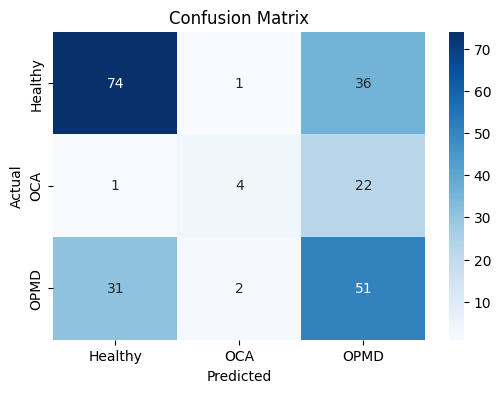

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(model, test_loader, device, classes)

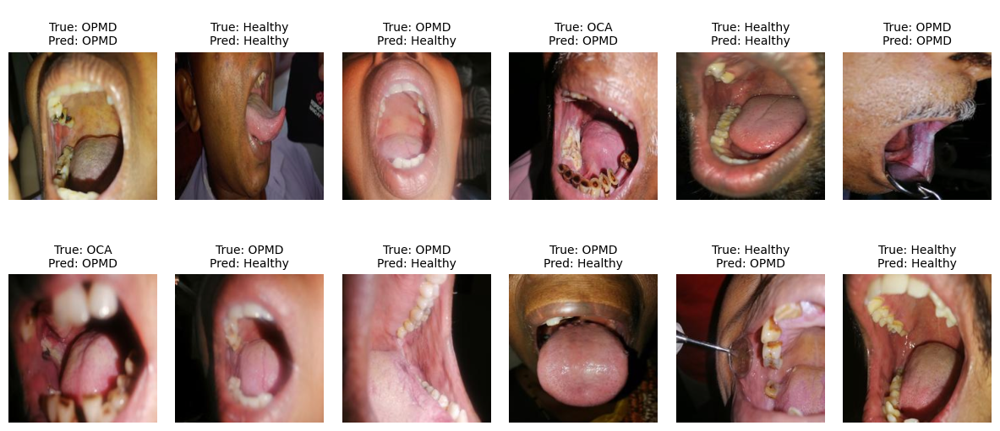

In [ ]:
visualize_predictions(model, test_loader, device, classes)

###### EXP_2

In [ ]:
CHECKPOINT_DIR = './resnet18_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.resnet18(weights=None)
  # Replace the final FC layer
  in_features = model.fc.in_features
  model.fc = nn.Linear(in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.resnet18(weights=None)
  # Replace the final FC layer
  in_features = best_model.fc.in_features
  best_model.fc = nn.Linear(in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.64it/s, Loss=0.0033]


Train Loss: 0.0084 | Train Acc: 0.9982


Validation Loss: 2.8583 | Validation Accuracy: 0.6667

New best model saved at epoch 1 with val acc = 0.6667

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.60it/s, Loss=0.0073]


Train Loss: 0.0367 | Train Acc: 0.9856


Validation Loss: 2.4021 | Validation Accuracy: 0.5696

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.59it/s, Loss=0.0196]


Train Loss: 0.0663 | Train Acc: 0.9847


Validation Loss: 2.5550 | Validation Accuracy: 0.6287

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.0393]


Train Loss: 0.0248 | Train Acc: 0.9919


Validation Loss: 2.8193 | Validation Accuracy: 0.6624

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:16<00:00,  1.12it/s, Loss=0.0115]


Train Loss: 0.0161 | Train Acc: 0.9955


Validation Loss: 2.2933 | Validation Accuracy: 0.6245

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.0176]


Train Loss: 0.0175 | Train Acc: 0.9937


Validation Loss: 2.2735 | Validation Accuracy: 0.6582


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6667


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 1 with val acc = 0.6667
Test Accuracy: 55.4054 %


              precision    recall  f1-score   support

     Healthy       0.70      0.60      0.65       111
         OCA       0.50      0.04      0.07        27
        OPMD       0.44      0.65      0.53        84

    accuracy                           0.55       222
   macro avg       0.55      0.43      0.42       222
weighted avg       0.58      0.55      0.53       222



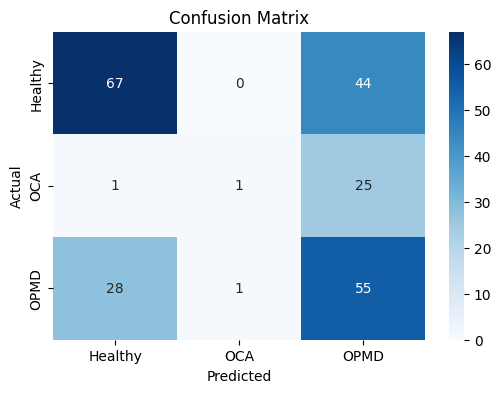

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

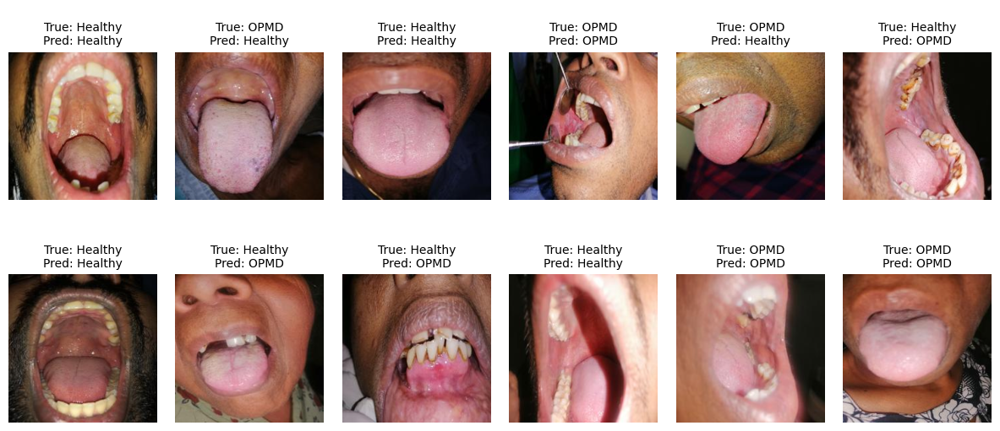

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=6)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 6
Test Accuracy: 59.4595 %


              precision    recall  f1-score   support

     Healthy       0.73      0.65      0.69       111
         OCA       0.44      0.15      0.22        27
        OPMD       0.49      0.67      0.56        84

    accuracy                           0.59       222
   macro avg       0.56      0.49      0.49       222
weighted avg       0.61      0.59      0.58       222



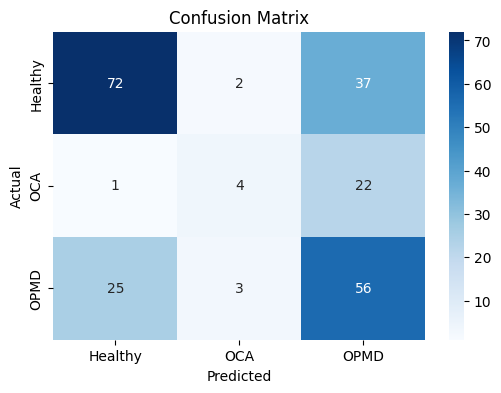

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

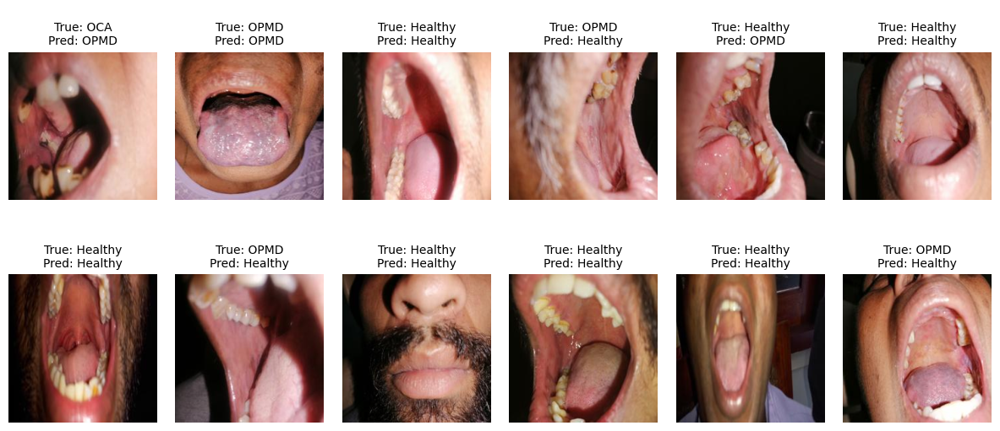

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### ResNet50

In [ ]:
CHECKPOINT_DIR = "./resnet50_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
num_classes = 3
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
# Replace the final FC layer
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 185MB/s]


In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):
  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.resnet50(weights=None)
  model.fc = nn.Linear(model.fc.in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.resnet50(weights=None)
  best_model.fc = nn.Linear(best_model.fc.in_features, num_classes)
  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc

###### EXP_1

In [ ]:
criterion = nn.CrossEntropyLoss(weight=weights)      # weighted cross entropy loss
optimizer = optim.Adam(model.parameters(), lr=1e-4)  # Adam optimizer

In [ ]:
def train(model, num_epochs, resume_epoch, patience=5):
    """
    Args:
        num_epochs: total epochs to train
        resume_epoch: start from this epoch if resuming
        patience: number of epochs with no improvement to wait before stopping
    """
    start_epoch = 1
    best_val_acc = 0.0
    epochs_no_improve = 0

    # Resume training if needed
    if resume_epoch is not None:
        resume_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{resume_epoch-1}.pth")
        if os.path.exists(resume_path):
            checkpoint = torch.load(resume_path, map_location=device)
            model.load_state_dict(checkpoint["model_state_dict"])
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            best_val_acc = checkpoint.get("best_val_acc", 0.0)
            start_epoch = resume_epoch
            print(f"Resuming training from epoch {start_epoch} with best val acc {best_val_acc:.4f}")
        else:
            print(f"Checkpoint not found at {resume_path}, starting fresh.")

    # Store metrics for plotting
    metrics = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
    }

    for epoch in range(start_epoch, num_epochs + 1):
        print(f"-----------------Epoch {epoch}---------------------")
        # ---------- TRAIN ----------
        model.train()
        running_loss, running_corrects = 0.0, 0

        train_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [Train]")
        for images, labels in train_bar:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            train_bar.set_postfix({"Loss": f"{loss.item():.4f}"})

        epoch_train_loss = running_loss / len(train_dataset)
        epoch_train_acc = running_corrects.double() / len(train_dataset)
        metrics["train_loss"].append(epoch_train_loss)
        metrics["train_acc"].append(epoch_train_acc.item())
        print(f"\nTrain Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # ---------- VALIDATION ----------
        model.eval()
        val_running_loss, val_corrects = 0.0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_corrects += torch.sum(preds == labels.data)

        epoch_val_loss = val_running_loss / len(val_dataset)
        epoch_val_acc = val_corrects.double() / len(val_dataset)
        metrics["val_loss"].append(epoch_val_loss)
        metrics["val_acc"].append(epoch_val_acc.item())
        print(f"Validation Loss: {epoch_val_loss:.4f} | Validation Accuracy: {epoch_val_acc:.4f}\n")

        # ---------- CHECKPOINTING ----------
        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            epochs_no_improve = 0
            best_ckpt_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
            torch.save({
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "loss": epoch_val_loss,
                "best_val_acc": best_val_acc,
                "metrics": metrics,
            }, best_ckpt_path)
            print(f"New best model saved at epoch {epoch} with val acc = {best_val_acc:.4f}\n")
        else:
            epochs_no_improve += 1

        # Save current epoch checkpoint
        checkpoint_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{epoch}.pth")
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": epoch_val_loss,
            "best_val_acc": best_val_acc,
            "metrics": metrics,
        }, checkpoint_path)

        # ---------- EARLY STOPPING ----------
        if epochs_no_improve >= patience:
            print(f"\nEarly stopping. No improvement in {patience} epochs.")
            break

    print(f"\nTraining complete. Best validation accuracy: {best_val_acc:.4f}")
    return metrics

In [ ]:
metrics =  train(model, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.32it/s, Loss=0.8329]


Train Loss: 0.9391 | Train Acc: 0.5158


Validation Loss: 1.0462 | Validation Accuracy: 0.4557

New best model saved at epoch 1 with val acc = 0.4557

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.32it/s, Loss=0.5815]


Train Loss: 0.5629 | Train Acc: 0.7151


Validation Loss: 1.0822 | Validation Accuracy: 0.5316

New best model saved at epoch 2 with val acc = 0.5316

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.34it/s, Loss=0.3745]


Train Loss: 0.4004 | Train Acc: 0.8070


Validation Loss: 1.5463 | Validation Accuracy: 0.6118

New best model saved at epoch 3 with val acc = 0.6118

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.29it/s, Loss=0.2103]


Train Loss: 0.3195 | Train Acc: 0.8422


Validation Loss: 1.4555 | Validation Accuracy: 0.6414

New best model saved at epoch 4 with val acc = 0.6414

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s, Loss=1.0578]


Train Loss: 0.2227 | Train Acc: 0.9035


Validation Loss: 1.2982 | Validation Accuracy: 0.5865

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s, Loss=0.0785]


Train Loss: 0.1564 | Train Acc: 0.9450


Validation Loss: 2.2788 | Validation Accuracy: 0.5696

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.33it/s, Loss=0.0969]


Train Loss: 0.1785 | Train Acc: 0.9252


Validation Loss: 1.8138 | Validation Accuracy: 0.6624

New best model saved at epoch 7 with val acc = 0.6624

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.30it/s, Loss=0.1303]


Train Loss: 0.1211 | Train Acc: 0.9468


Validation Loss: 1.9671 | Validation Accuracy: 0.6034

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.29it/s, Loss=0.0644]


Train Loss: 0.0854 | Train Acc: 0.9675


Validation Loss: 1.6768 | Validation Accuracy: 0.5907

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.35it/s, Loss=0.2572]


Train Loss: 0.0791 | Train Acc: 0.9720


Validation Loss: 1.6154 | Validation Accuracy: 0.5949

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.23it/s, Loss=0.0559]


Train Loss: 0.0568 | Train Acc: 0.9757


Validation Loss: 1.3903 | Validation Accuracy: 0.5696

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.0175]


Train Loss: 0.0446 | Train Acc: 0.9811


Validation Loss: 1.7517 | Validation Accuracy: 0.6203


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6624


In [ ]:
ckpt_epoch =12
ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
# Recreate model architecture
num_classes = 3  # adjust to your dataset
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Load the checkpoint
checkpoint = torch.load(ckpt_model_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()
print(f"Loaded model from epoch {checkpoint['epoch']}")
# Testing
test_corrects = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images).to(device)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
test_acc = test_corrects.double() / len(test_dataset)
print(f"Test Accuracy: {test_acc:.4f}")

Loaded model from epoch 12
Test Accuracy: 0.5676


In [ ]:
best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
num_classes = 3
best_model = models.resnet50(weights=None)
best_model.fc = nn.Linear(best_model.fc.in_features, num_classes)
checkpoint = torch.load(best_model_path, map_location=device)
best_model.load_state_dict(checkpoint['model_state_dict'])
best_model.to(device)
best_model.eval()
print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
# Testing
test_corrects = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = best_model(images).to(device)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
test_acc = test_corrects.double() / len(test_dataset)
print(f"Test Accuracy: {test_acc:.4f}")

Loaded best model from epoch 7 with val acc = 0.6624
Test Accuracy: 0.5766


              precision    recall  f1-score   support

     Healthy       0.76      0.57      0.65       111
         OCA       0.40      0.15      0.22        27
        OPMD       0.47      0.73      0.57        84

    accuracy                           0.58       222
   macro avg       0.54      0.48      0.48       222
weighted avg       0.61      0.58      0.57       222



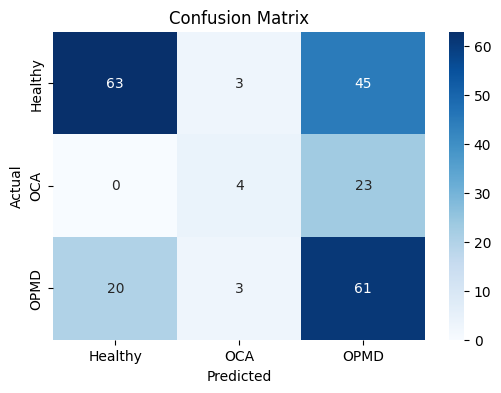

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

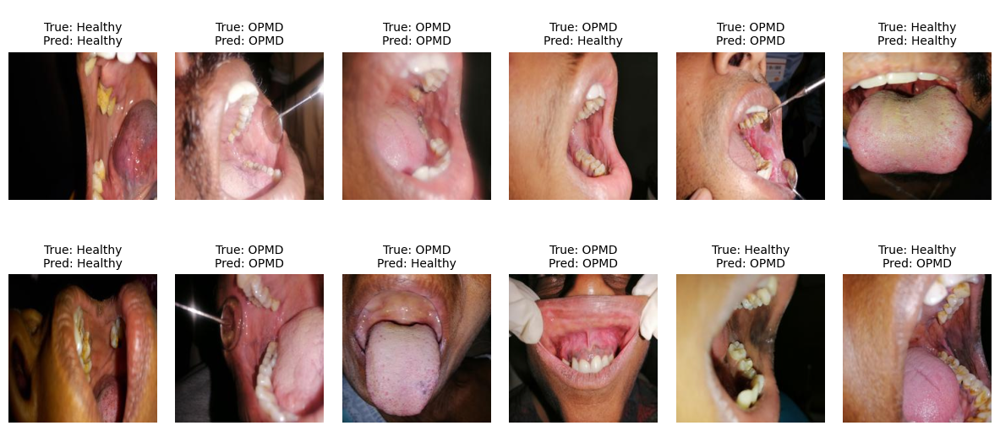

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

###### EXP_2

In [ ]:
CHECKPOINT_DIR = "./resnet50_exp2_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
num_classes = 3
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
# Replace the final FC layer
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:16<00:00,  1.08it/s, Loss=1.0070]


Train Loss: 0.8141 | Train Acc: 0.5879


Validation Loss: 0.8950 | Validation Accuracy: 0.6203

New best model saved at epoch 1 with val acc = 0.6203

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.29it/s, Loss=0.5822]


Train Loss: 0.5148 | Train Acc: 0.7529


Validation Loss: 1.2889 | Validation Accuracy: 0.5654

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.30it/s, Loss=0.6102]


Train Loss: 0.3840 | Train Acc: 0.8170


Validation Loss: 1.5852 | Validation Accuracy: 0.5401

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s, Loss=0.1789]


Train Loss: 0.2820 | Train Acc: 0.8954


Validation Loss: 1.1755 | Validation Accuracy: 0.6118

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.2032]


Train Loss: 0.1764 | Train Acc: 0.9288


Validation Loss: 1.7435 | Validation Accuracy: 0.6287

New best model saved at epoch 5 with val acc = 0.6287

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.1003]


Train Loss: 0.1338 | Train Acc: 0.9513


Validation Loss: 1.2778 | Validation Accuracy: 0.6667

New best model saved at epoch 6 with val acc = 0.6667

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.31it/s, Loss=0.0992]


Train Loss: 0.0668 | Train Acc: 0.9766


Validation Loss: 1.4194 | Validation Accuracy: 0.6835

New best model saved at epoch 7 with val acc = 0.6835

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.24it/s, Loss=0.0569]


Train Loss: 0.0594 | Train Acc: 0.9820


Validation Loss: 1.4615 | Validation Accuracy: 0.6329

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.22it/s, Loss=0.0428]


Train Loss: 0.0517 | Train Acc: 0.9901


Validation Loss: 1.3686 | Validation Accuracy: 0.6582

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s, Loss=0.0096]


Train Loss: 0.0385 | Train Acc: 0.9865


Validation Loss: 1.5903 | Validation Accuracy: 0.6709

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.31it/s, Loss=0.0385]


Train Loss: 0.0238 | Train Acc: 0.9937


Validation Loss: 1.5268 | Validation Accuracy: 0.6540

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.25it/s, Loss=0.0804]


Train Loss: 0.0228 | Train Acc: 0.9937


Validation Loss: 1.6088 | Validation Accuracy: 0.6624


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6835


In [ ]:
t1 = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 7 with val acc = 0.6835
Test Accuracy: 57.6577 %


In [ ]:
t2,model = test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=12)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 12
Test Accuracy: 61.2613 %


              precision    recall  f1-score   support

     Healthy       0.68      0.72      0.70       111
         OCA       1.00      0.33      0.50        27
        OPMD       0.49      0.56      0.53        84

    accuracy                           0.61       222
   macro avg       0.72      0.54      0.57       222
weighted avg       0.65      0.61      0.61       222



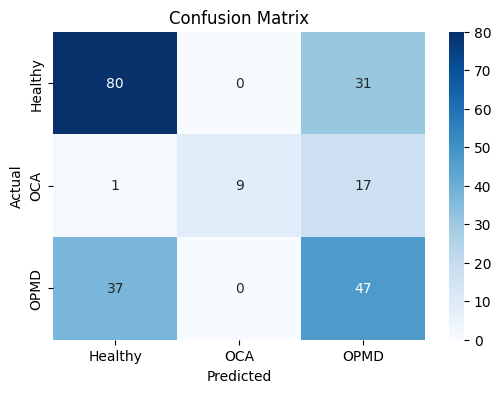

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(model, test_loader, device, classes)

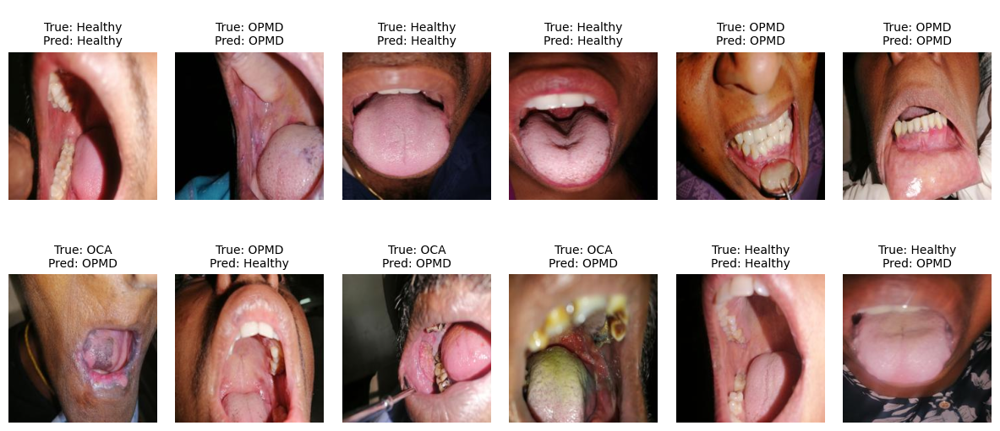

In [ ]:
visualize_predictions(model, test_loader, device, classes, num_images=12)

##### DenseNet121

In [ ]:
def train(model,CHECKPOINT_DIR, num_epochs, resume_epoch, patience=5):
    """
    Args:
        num_epochs: total epochs to train
        resume_epoch: start from this epoch if resuming
        patience: number of epochs with no improvement to wait before stopping
    """
    start_epoch = 1
    best_val_acc = 0.0
    epochs_no_improve = 0

    # Resume training if needed
    if resume_epoch is not None:
        resume_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{resume_epoch-1}.pth")
        if os.path.exists(resume_path):
            checkpoint = torch.load(resume_path, map_location=device)
            model.load_state_dict(checkpoint["model_state_dict"])
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            best_val_acc = checkpoint.get("best_val_acc", 0.0)
            start_epoch = resume_epoch
            print(f"Resuming training from epoch {start_epoch} with best val acc {best_val_acc:.4f}")
        else:
            print(f"Checkpoint not found at {resume_path}, starting fresh.")

    # Store metrics for plotting
    metrics = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
    }

    for epoch in range(start_epoch, num_epochs + 1):
        print(f"-----------------Epoch {epoch}---------------------")
        # ---------- TRAIN ----------
        model.train()
        running_loss, running_corrects = 0.0, 0

        train_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [Train]")
        for images, labels in train_bar:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            train_bar.set_postfix({"Loss": f"{loss.item():.4f}"})

        epoch_train_loss = running_loss / len(train_dataset)
        epoch_train_acc = running_corrects.double() / len(train_dataset)
        metrics["train_loss"].append(epoch_train_loss)
        metrics["train_acc"].append(epoch_train_acc.item())
        print(f"\nTrain Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # ---------- VALIDATION ----------
        model.eval()
        val_running_loss, val_corrects = 0.0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_corrects += torch.sum(preds == labels.data)

        epoch_val_loss = val_running_loss / len(val_dataset)
        epoch_val_acc = val_corrects.double() / len(val_dataset)
        metrics["val_loss"].append(epoch_val_loss)
        metrics["val_acc"].append(epoch_val_acc.item())
        print(f"Validation Loss: {epoch_val_loss:.4f} | Validation Accuracy: {epoch_val_acc:.4f}\n")

        # ---------- CHECKPOINTING ----------
        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            epochs_no_improve = 0
            best_ckpt_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
            torch.save({
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "loss": epoch_val_loss,
                "best_val_acc": best_val_acc,
                "metrics": metrics,
            }, best_ckpt_path)
            print(f"New best model saved at epoch {epoch} with val acc = {best_val_acc:.4f}\n")
        else:
            epochs_no_improve += 1

        # Save current epoch checkpoint
        checkpoint_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{epoch}.pth")
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": epoch_val_loss,
            "best_val_acc": best_val_acc,
            "metrics": metrics,
        }, checkpoint_path)

        # ---------- EARLY STOPPING ----------
        if epochs_no_improve >= patience:
            print(f"\nEarly stopping. No improvement in {patience} epochs.")
            break

    print(f"\nTraining complete. Best validation accuracy: {best_val_acc:.4f}")
    return metrics

In [ ]:
num_classes = 3

# Load pretrained DenseNet-121
model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

# Replace the classifier (final fully connected layer)
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(in_features, num_classes)
)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 164MB/s]


In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

In [ ]:
CHECKPOINT_DIR = "./densenet121_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
metrics =  train(model,CHECKPOINT_DIR ,num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s, Loss=0.7672]


Train Loss: 1.0389 | Train Acc: 0.4265


Validation Loss: 0.9390 | Validation Accuracy: 0.5654

New best model saved at epoch 1 with val acc = 0.5654

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.29it/s, Loss=0.7352]


Train Loss: 0.7978 | Train Acc: 0.6303


Validation Loss: 0.8673 | Validation Accuracy: 0.5527

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.24it/s, Loss=0.7690]


Train Loss: 0.6767 | Train Acc: 0.6673


Validation Loss: 0.8346 | Validation Accuracy: 0.5781

New best model saved at epoch 3 with val acc = 0.5781

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s, Loss=0.8981]


Train Loss: 0.5378 | Train Acc: 0.7376


Validation Loss: 0.8835 | Validation Accuracy: 0.5949

New best model saved at epoch 4 with val acc = 0.5949

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s, Loss=0.4231]


Train Loss: 0.4349 | Train Acc: 0.7998


Validation Loss: 0.9272 | Validation Accuracy: 0.5823

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.23it/s, Loss=0.7004]


Train Loss: 0.3580 | Train Acc: 0.8287


Validation Loss: 0.9451 | Validation Accuracy: 0.5865

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.25it/s, Loss=0.2317]


Train Loss: 0.3171 | Train Acc: 0.8575


Validation Loss: 0.9232 | Validation Accuracy: 0.5949

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.25it/s, Loss=0.3640]


Train Loss: 0.2477 | Train Acc: 0.8891


Validation Loss: 1.1732 | Validation Accuracy: 0.6498

New best model saved at epoch 8 with val acc = 0.6498

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s, Loss=0.1103]


Train Loss: 0.2028 | Train Acc: 0.9143


Validation Loss: 1.0949 | Validation Accuracy: 0.6498

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.0987]


Train Loss: 0.1570 | Train Acc: 0.9423


Validation Loss: 1.1308 | Validation Accuracy: 0.5823

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.24it/s, Loss=0.0831]


Train Loss: 0.1167 | Train Acc: 0.9603


Validation Loss: 1.4864 | Validation Accuracy: 0.6245

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s, Loss=0.1064]


Train Loss: 0.0891 | Train Acc: 0.9784


Validation Loss: 1.3582 | Validation Accuracy: 0.5907

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s, Loss=0.1331]


Train Loss: 0.0870 | Train Acc: 0.9748


Validation Loss: 1.5172 | Validation Accuracy: 0.6245


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6498


In [ ]:
best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
num_classes = 3

# Load pretrained DenseNet-121
best_model = models.densenet121(weights=None)
in_features = best_model.classifier.in_features
best_model.classifier = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(in_features, num_classes)
)
checkpoint = torch.load(best_model_path, map_location=device)
best_model.load_state_dict(checkpoint['model_state_dict'])
best_model.to(device)
best_model.eval()

print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
# Testing
test_corrects = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = best_model(images).to(device)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
test_acc = test_corrects.double() / len(test_dataset)
print(f"Test Accuracy: {test_acc:.4f}")

Loaded best model from epoch 8 with val acc = 0.6498
Test Accuracy: 0.5811


              precision    recall  f1-score   support

     Healthy       0.69      0.68      0.68       111
         OCA       0.75      0.22      0.34        27
        OPMD       0.46      0.57      0.51        84

    accuracy                           0.58       222
   macro avg       0.63      0.49      0.51       222
weighted avg       0.61      0.58      0.57       222



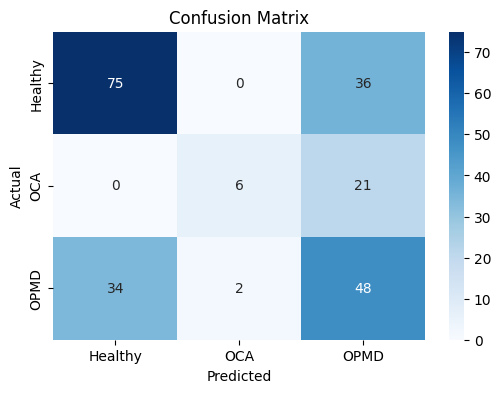

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

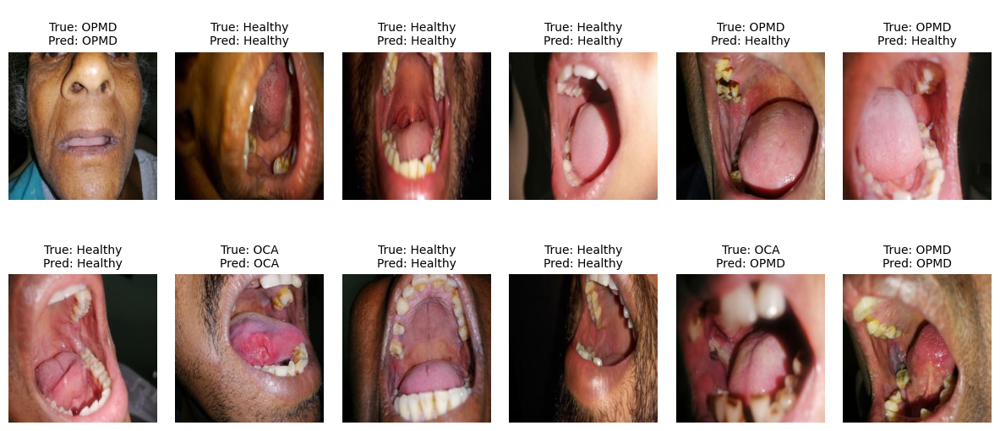

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

##### EfficientNet-B0

In [ ]:
CHECKPOINT_DIR = './efficientnetb0_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.efficientnet_b0(weights=None)
  in_features = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.efficientnet_b0(weights=None)
  in_features = best_model.classifier[1].in_features
  best_model.classifier[1] = nn.Linear(in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
num_classes = 3
model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 106MB/s] 


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s, Loss=1.0338]


Train Loss: 1.0684 | Train Acc: 0.3571


Validation Loss: 1.0422 | Validation Accuracy: 0.4304

New best model saved at epoch 1 with val acc = 0.4304

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s, Loss=1.0057]


Train Loss: 0.9111 | Train Acc: 0.5482


Validation Loss: 0.9948 | Validation Accuracy: 0.4852

New best model saved at epoch 2 with val acc = 0.4852

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s, Loss=0.7147]


Train Loss: 0.7713 | Train Acc: 0.6447


Validation Loss: 0.9656 | Validation Accuracy: 0.5612

New best model saved at epoch 3 with val acc = 0.5612

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s, Loss=0.4131]


Train Loss: 0.6774 | Train Acc: 0.6709


Validation Loss: 0.9695 | Validation Accuracy: 0.5570

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s, Loss=0.5197]


Train Loss: 0.5814 | Train Acc: 0.7511


Validation Loss: 0.9612 | Validation Accuracy: 0.5992

New best model saved at epoch 5 with val acc = 0.5992

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.50it/s, Loss=0.4260]


Train Loss: 0.5156 | Train Acc: 0.7719


Validation Loss: 0.9821 | Validation Accuracy: 0.5907

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.4249]


Train Loss: 0.4611 | Train Acc: 0.8034


Validation Loss: 1.0372 | Validation Accuracy: 0.6287

New best model saved at epoch 7 with val acc = 0.6287

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s, Loss=0.9688]


Train Loss: 0.3975 | Train Acc: 0.8242


Validation Loss: 1.0842 | Validation Accuracy: 0.6160

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.4491]


Train Loss: 0.3567 | Train Acc: 0.8449


Validation Loss: 1.1520 | Validation Accuracy: 0.6203

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s, Loss=0.5902]


Train Loss: 0.3250 | Train Acc: 0.8647


Validation Loss: 1.1922 | Validation Accuracy: 0.6287

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.3622]


Train Loss: 0.2890 | Train Acc: 0.8665


Validation Loss: 1.2239 | Validation Accuracy: 0.6287

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.48it/s, Loss=0.2410]


Train Loss: 0.2586 | Train Acc: 0.8864


Validation Loss: 1.2488 | Validation Accuracy: 0.6203


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6287


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 7 with val acc = 0.6287
Test Accuracy: 56.7568 %


              precision    recall  f1-score   support

     Healthy       0.67      0.63      0.65       111
         OCA       0.50      0.41      0.45        27
        OPMD       0.47      0.54      0.50        84

    accuracy                           0.57       222
   macro avg       0.55      0.52      0.53       222
weighted avg       0.57      0.57      0.57       222



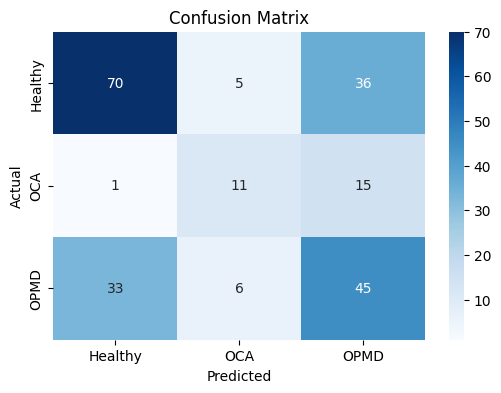

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

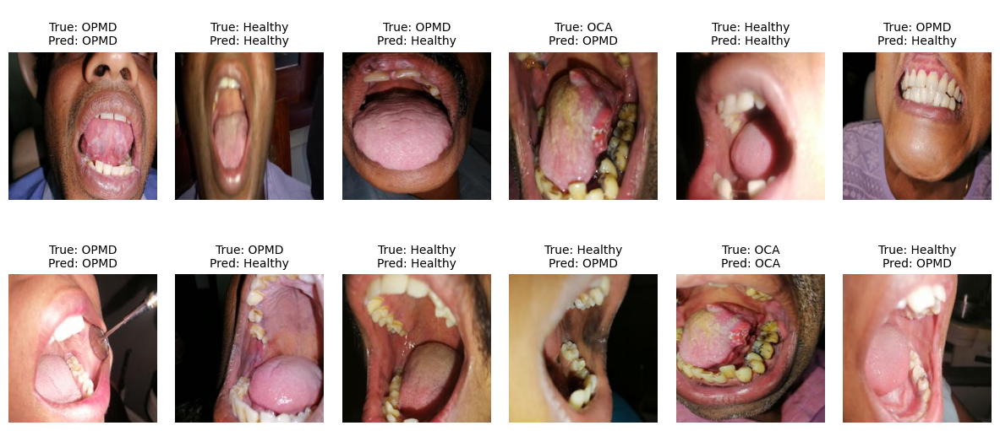

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=12)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 12
Test Accuracy: 59.0090 %


              precision    recall  f1-score   support

     Healthy       0.68      0.68      0.68       111
         OCA       0.62      0.37      0.47        27
        OPMD       0.47      0.54      0.50        84

    accuracy                           0.59       222
   macro avg       0.59      0.53      0.55       222
weighted avg       0.60      0.59      0.59       222



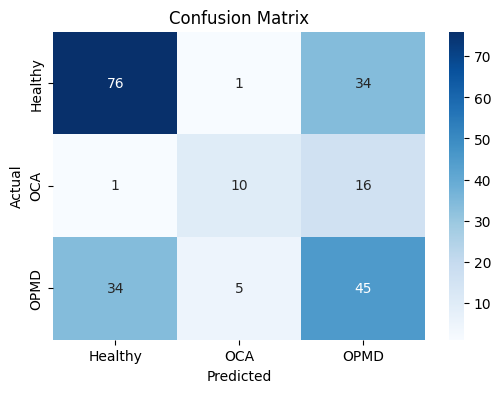

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

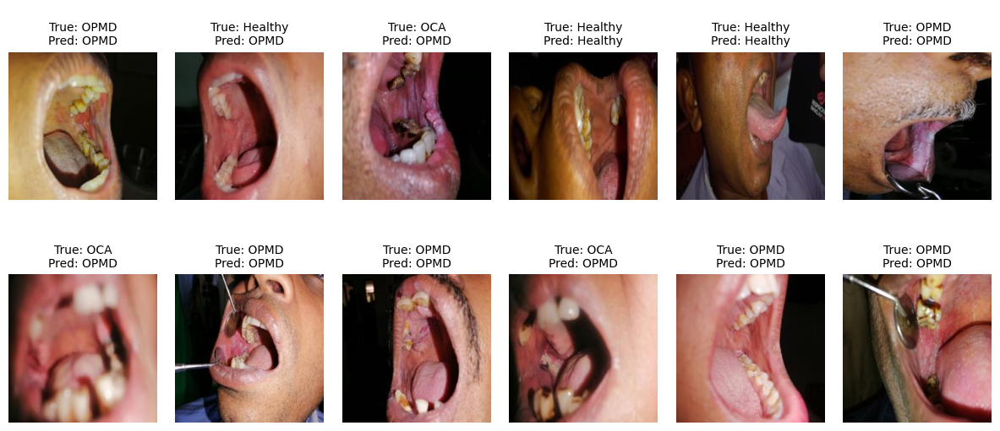

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### EfficientNet-B3

In [ ]:
CHECKPOINT_DIR = './efficientnetb3_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
num_classes = 3
model = models.efficientnet_b3(weights=models.EfficientNet_B3_Weights.IMAGENET1K_V1)
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth


100%|██████████| 47.2M/47.2M [00:00<00:00, 130MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=40, bias=False)
            (1): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(40, 10, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(10, 40, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.efficientnet_b3(weights=None)
  in_features = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.efficientnet_b3(weights=None)
  in_features = best_model.classifier[1].in_features
  best_model.classifier[1] = nn.Linear(in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.31it/s, Loss=1.1027]


Train Loss: 1.0836 | Train Acc: 0.4076


Validation Loss: 1.0616 | Validation Accuracy: 0.4304

New best model saved at epoch 1 with val acc = 0.4304

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s, Loss=0.9728]


Train Loss: 1.0021 | Train Acc: 0.5248


Validation Loss: 1.0261 | Validation Accuracy: 0.4599

New best model saved at epoch 2 with val acc = 0.4599

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.9047]


Train Loss: 0.9192 | Train Acc: 0.5942


Validation Loss: 0.9867 | Validation Accuracy: 0.4726

New best model saved at epoch 3 with val acc = 0.4726

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s, Loss=1.1001]


Train Loss: 0.8251 | Train Acc: 0.6583


Validation Loss: 0.9410 | Validation Accuracy: 0.5443

New best model saved at epoch 4 with val acc = 0.5443

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.35it/s, Loss=0.5654]


Train Loss: 0.7229 | Train Acc: 0.6844


Validation Loss: 0.9135 | Validation Accuracy: 0.5401

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.31it/s, Loss=0.5641]


Train Loss: 0.6340 | Train Acc: 0.7241


Validation Loss: 0.9065 | Validation Accuracy: 0.5696

New best model saved at epoch 6 with val acc = 0.5696

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.5800]


Train Loss: 0.5481 | Train Acc: 0.7547


Validation Loss: 0.9022 | Validation Accuracy: 0.5654

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.30it/s, Loss=0.7600]


Train Loss: 0.4866 | Train Acc: 0.7818


Validation Loss: 0.8969 | Validation Accuracy: 0.5654

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s, Loss=0.3305]


Train Loss: 0.4261 | Train Acc: 0.8170


Validation Loss: 0.9419 | Validation Accuracy: 0.5865

New best model saved at epoch 9 with val acc = 0.5865

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s, Loss=0.4816]


Train Loss: 0.3838 | Train Acc: 0.8404


Validation Loss: 0.9926 | Validation Accuracy: 0.5907

New best model saved at epoch 10 with val acc = 0.5907

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.29it/s, Loss=0.1989]


Train Loss: 0.3617 | Train Acc: 0.8359


Validation Loss: 1.0004 | Validation Accuracy: 0.6034

New best model saved at epoch 11 with val acc = 0.6034

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.3842]


Train Loss: 0.3246 | Train Acc: 0.8674


Validation Loss: 1.0309 | Validation Accuracy: 0.6034

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.33it/s, Loss=0.3864]


Train Loss: 0.3043 | Train Acc: 0.8539


Validation Loss: 1.0490 | Validation Accuracy: 0.5781

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s, Loss=0.3979]


Train Loss: 0.3097 | Train Acc: 0.8593


Validation Loss: 1.0738 | Validation Accuracy: 0.5949

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s, Loss=0.1764]


Train Loss: 0.2854 | Train Acc: 0.8765


Validation Loss: 1.0706 | Validation Accuracy: 0.5907

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:14<00:00,  1.28it/s, Loss=0.2189]


Train Loss: 0.2500 | Train Acc: 0.9008


Validation Loss: 1.0717 | Validation Accuracy: 0.5949


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6034


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 11 with val acc = 0.6034
Test Accuracy: 58.1081 %


              precision    recall  f1-score   support

     Healthy       0.68      0.62      0.65       111
         OCA       0.67      0.44      0.53        27
        OPMD       0.47      0.57      0.52        84

    accuracy                           0.58       222
   macro avg       0.60      0.55      0.57       222
weighted avg       0.60      0.58      0.58       222



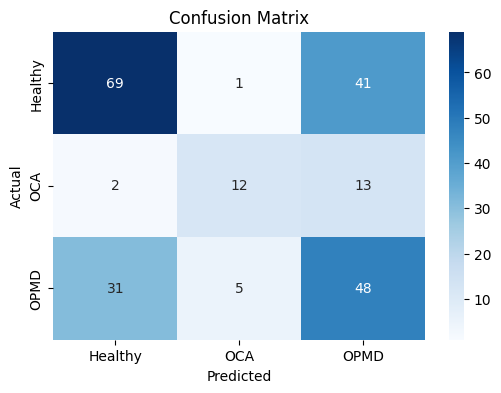

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

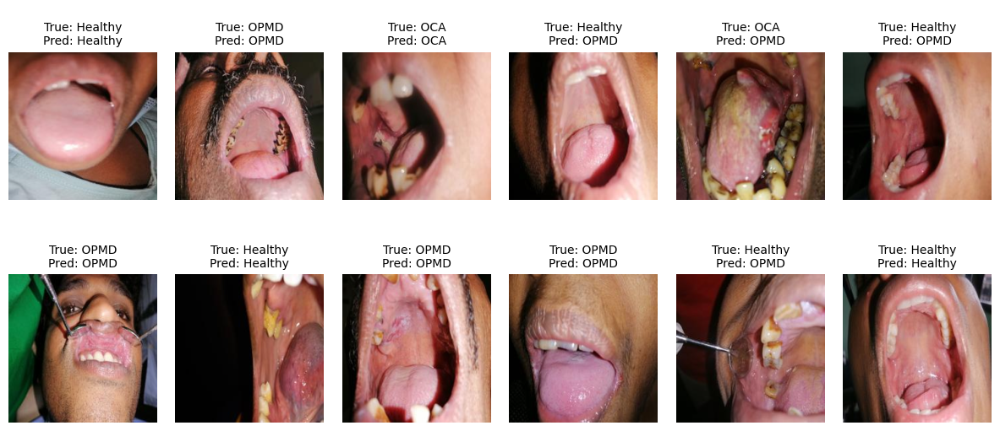

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=16)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 16
Test Accuracy: 58.5586 %


              precision    recall  f1-score   support

     Healthy       0.69      0.61      0.65       111
         OCA       0.71      0.44      0.55        27
        OPMD       0.47      0.60      0.53        84

    accuracy                           0.59       222
   macro avg       0.62      0.55      0.57       222
weighted avg       0.61      0.59      0.59       222



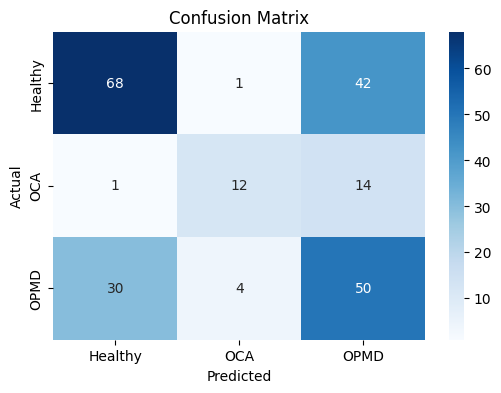

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

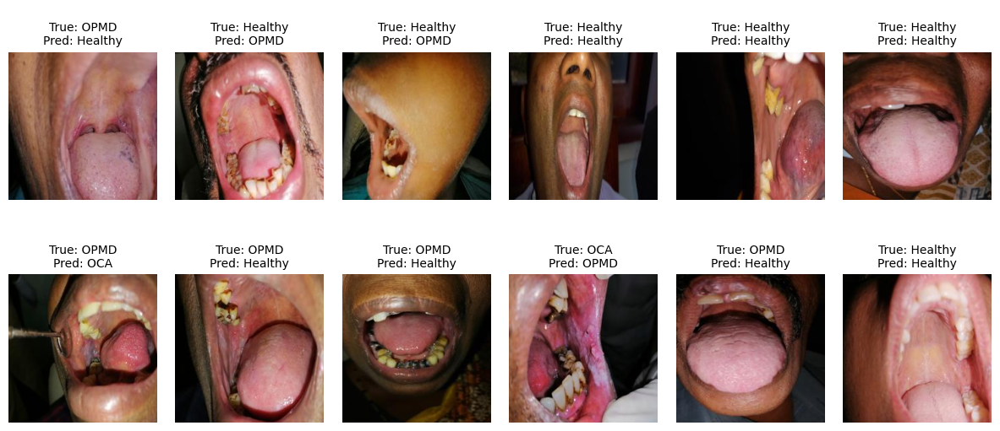

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### Vision Transformer(Vit_b_16)

In [ ]:
CHECKPOINT_DIR = './vit_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
num_classes = 3
from torchvision.models import vit_b_16, ViT_B_16_Weights
model = vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1)
model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)
model.to(device)

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = vit_b_16(weights=None)
  model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = vit_b_16(weights=None)
  best_model.heads.head = nn.Linear(best_model.heads.head.in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [02:41<00:00,  8.98s/it, Loss=1.1074]


Train Loss: 1.1805 | Train Acc: 0.3796


Validation Loss: 1.0797 | Validation Accuracy: 0.3966

New best model saved at epoch 1 with val acc = 0.3966

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.08s/it, Loss=0.8804]


Train Loss: 1.0023 | Train Acc: 0.4806


Validation Loss: 1.1398 | Validation Accuracy: 0.4304

New best model saved at epoch 2 with val acc = 0.4304

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:38<00:00,  2.11s/it, Loss=0.6859]


Train Loss: 0.9709 | Train Acc: 0.5113


Validation Loss: 0.8847 | Validation Accuracy: 0.6034

New best model saved at epoch 3 with val acc = 0.6034

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:40<00:00,  2.24s/it, Loss=1.0215]


Train Loss: 0.8142 | Train Acc: 0.5951


Validation Loss: 0.9973 | Validation Accuracy: 0.5443

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:40<00:00,  2.27s/it, Loss=0.5292]


Train Loss: 0.6793 | Train Acc: 0.6808


Validation Loss: 0.8270 | Validation Accuracy: 0.5148

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:41<00:00,  2.29s/it, Loss=0.4267]


Train Loss: 0.4778 | Train Acc: 0.7547


Validation Loss: 0.8728 | Validation Accuracy: 0.5696

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:40<00:00,  2.26s/it, Loss=0.2303]


Train Loss: 0.4177 | Train Acc: 0.7683


Validation Loss: 1.2679 | Validation Accuracy: 0.5359

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:40<00:00,  2.24s/it, Loss=0.1912]


Train Loss: 0.3308 | Train Acc: 0.8070


Validation Loss: 1.4856 | Validation Accuracy: 0.5443


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6034


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 3 with val acc = 0.6034
Test Accuracy: 59.9099 %


              precision    recall  f1-score   support

     Healthy       0.66      0.70      0.68       111
         OCA       0.65      0.41      0.50        27
        OPMD       0.51      0.52      0.51        84

    accuracy                           0.60       222
   macro avg       0.60      0.54      0.57       222
weighted avg       0.60      0.60      0.60       222



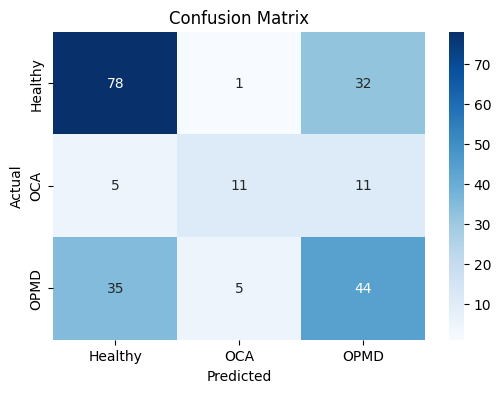

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

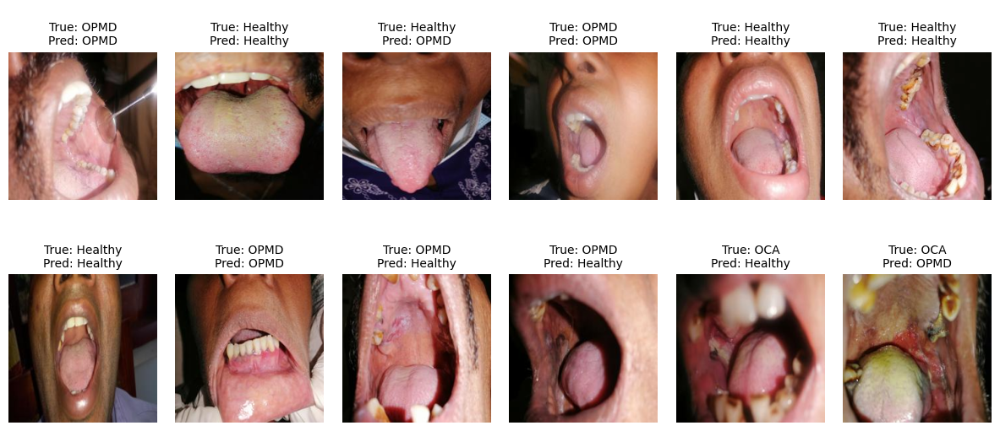

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=8)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 8
Test Accuracy: 62.1622 %


              precision    recall  f1-score   support

     Healthy       0.64      0.87      0.74       111
         OCA       0.73      0.41      0.52        27
        OPMD       0.54      0.36      0.43        84

    accuracy                           0.62       222
   macro avg       0.64      0.55      0.56       222
weighted avg       0.61      0.62      0.60       222



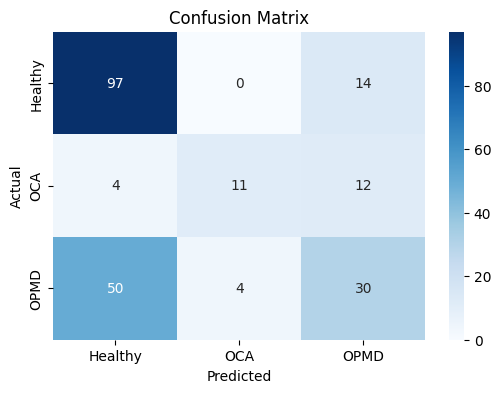

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

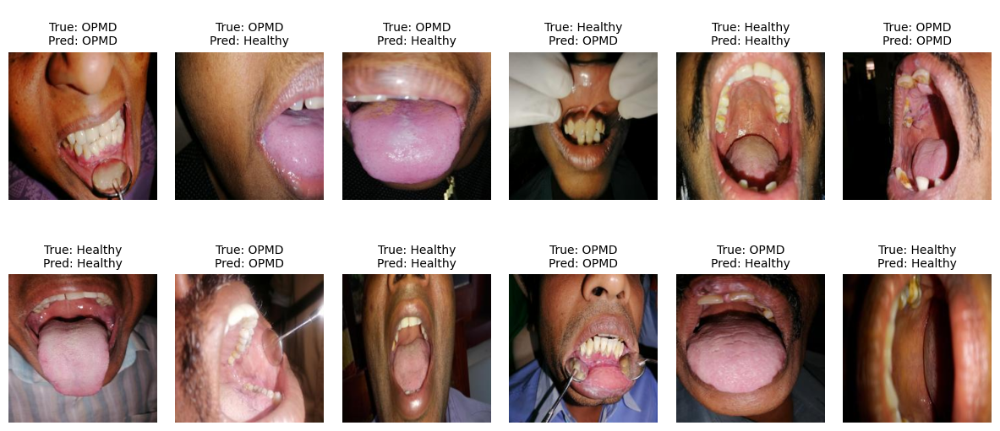

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### ConvNeXt(Modern CNN)
* A strong hybrid between CNN and transformer-style design

In [32]:
CHECKPOINT_DIR = './convnext_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [33]:
num_classes = 3
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
model.classifier[2] = nn.Linear(model.classifier[2].in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 187MB/s] 


ConvNeXt(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
    )
    (1): Sequential(
      (0): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=96, out_features=384, bias=True)
          (4): GELU(approximate='none')
          (5): Linear(in_features=384, out_features=96, bias=True)
          (6): Permute()
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=

In [34]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = convnext_tiny(weights=None)
  model.classifier[2] = nn.Linear(model.classifier[2].in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [35]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = convnext_tiny(weights=None)
  best_model.classifier[2] = nn.Linear(best_model.classifier[2].in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [36]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [37]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [38]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:26<00:00,  1.46s/it, Loss=0.9724]


Train Loss: 1.0194 | Train Acc: 0.4842


Validation Loss: 0.9309 | Validation Accuracy: 0.5570

New best model saved at epoch 1 with val acc = 0.5570

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it, Loss=0.6386]


Train Loss: 0.7010 | Train Acc: 0.6997


Validation Loss: 0.8604 | Validation Accuracy: 0.6287

New best model saved at epoch 2 with val acc = 0.6287

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.5305]


Train Loss: 0.5151 | Train Acc: 0.7556


Validation Loss: 0.9808 | Validation Accuracy: 0.5316

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:19<00:00,  1.07s/it, Loss=0.4680]


Train Loss: 0.3643 | Train Acc: 0.8395


Validation Loss: 0.9041 | Validation Accuracy: 0.6582

New best model saved at epoch 4 with val acc = 0.6582

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it, Loss=0.1846]


Train Loss: 0.2834 | Train Acc: 0.8756


Validation Loss: 1.0352 | Validation Accuracy: 0.6203

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.05s/it, Loss=0.1796]


Train Loss: 0.2020 | Train Acc: 0.9225


Validation Loss: 1.3737 | Validation Accuracy: 0.5949

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it, Loss=0.1265]


Train Loss: 0.1323 | Train Acc: 0.9603


Validation Loss: 1.3852 | Validation Accuracy: 0.6624

New best model saved at epoch 7 with val acc = 0.6624

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:19<00:00,  1.06s/it, Loss=0.0930]


Train Loss: 0.1088 | Train Acc: 0.9630


Validation Loss: 1.3246 | Validation Accuracy: 0.6709

New best model saved at epoch 8 with val acc = 0.6709

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it, Loss=0.0664]


Train Loss: 0.0830 | Train Acc: 0.9802


Validation Loss: 1.4066 | Validation Accuracy: 0.6624

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:19<00:00,  1.06s/it, Loss=0.0243]


Train Loss: 0.0706 | Train Acc: 0.9811


Validation Loss: 1.7391 | Validation Accuracy: 0.6582

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:19<00:00,  1.06s/it, Loss=0.0404]


Train Loss: 0.0466 | Train Acc: 0.9919


Validation Loss: 1.4089 | Validation Accuracy: 0.6287

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.0242]


Train Loss: 0.0390 | Train Acc: 0.9919


Validation Loss: 1.7547 | Validation Accuracy: 0.6667

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:19<00:00,  1.07s/it, Loss=0.0237]


Train Loss: 0.0359 | Train Acc: 0.9901


Validation Loss: 1.7049 | Validation Accuracy: 0.6709


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6709


In [39]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 8 with val acc = 0.6709
Test Accuracy: 59.9099 %


              precision    recall  f1-score   support

     Healthy       0.72      0.63      0.67       111
         OCA       0.73      0.30      0.42        27
        OPMD       0.48      0.65      0.56        84

    accuracy                           0.60       222
   macro avg       0.64      0.53      0.55       222
weighted avg       0.63      0.60      0.60       222



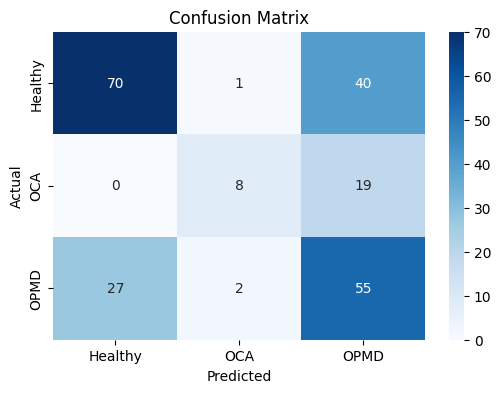

In [40]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

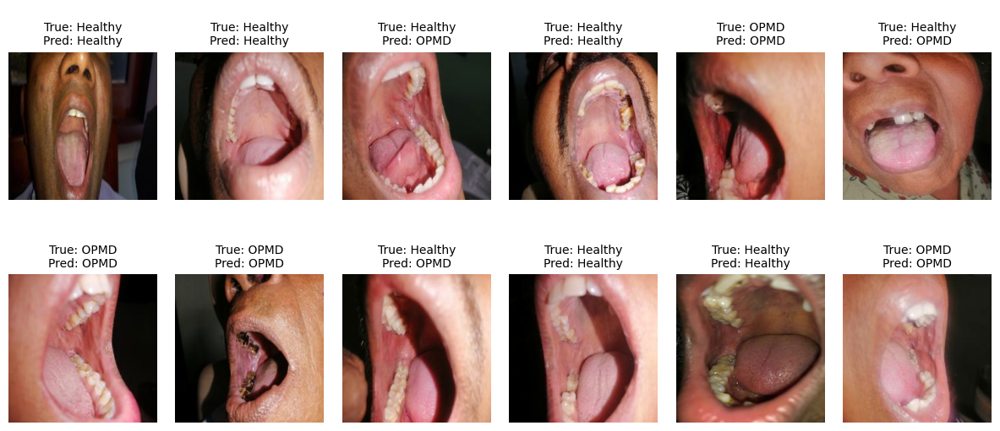

In [41]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [42]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=13)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 13
Test Accuracy: 62.6126 %


              precision    recall  f1-score   support

     Healthy       0.73      0.69      0.71       111
         OCA       0.73      0.30      0.42        27
        OPMD       0.51      0.64      0.57        84

    accuracy                           0.63       222
   macro avg       0.66      0.54      0.57       222
weighted avg       0.65      0.63      0.62       222



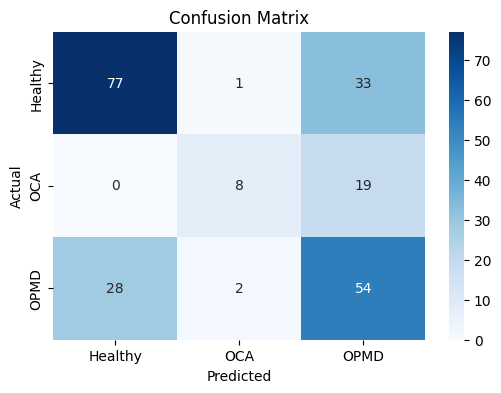

In [43]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

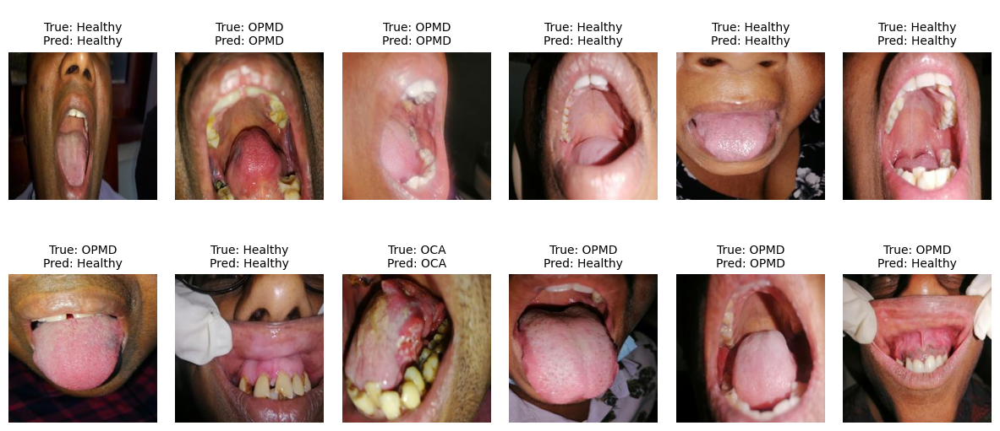

In [44]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

#### Model Performance Comparison

| Model | Config | Val Acc (%) | Test Acc (%) | Healthy F1 | OCA F1 | OPMD F1 | Macro Avg F1 | Weighted Avg F1 |
|-------|--------|-------------|--------------|------------|------------|-------------|------------------|---------------------|
| **ResNet18** | A: Adam + Weighted CE | 61.2 | 58.1 | 0.68 | 0.24 | 0.53 | 0.48 | 0.57 |
| **ResNet18** | B: AdamW + CosineAnnealing | 65.8 | 59.5 | 0.69 | 0.22 | 0.56 | 0.49 | 0.58 |
| **ResNet50** | A: Adam + Weighted CE | 66.2 | 57.7 | 0.65 | 0.22 | 0.57 | 0.48 | 0.57 |
| **ResNet50** | **B: AdamW + CosineAnnealing** | 66.2 | **61.3** | 0.70 | 0.50 | 0.53 | 0.57 | 0.61 |
| **DenseNet121** | AdamW + CosineAnnealing | 65.0 | 58.1 | 0.68 | 0.34 | 0.51 | 0.51 | 0.57 |
| **EfficientNet-B0** | AdamW + CosineAnnealing | 62.0 | 59.0 | 0.68 | 0.47 | 0.50 | 0.55 | 0.59 |
| **EfficientNet-B3** | AdamW + CosineAnnealing | 59.5 | 58.6 | 0.65 | 0.55 | 0.53 | 0.57 | 0.59 |
| **ViT_b_16** | **AdamW + CosineAnnealing** | 54.4 | **62.2** | 0.74 | 0.52 | 0.43 | 0.56 | 0.60 |
| **ConvNeXt** | **AdamW + CosineAnnealing** | **67.1** | **62.6** | 0.71 | 0.42 | 0.57 | 0.57 | 0.62 |



**1. ConvNeXt - AdamW + CosineAnnealing**
- **Test Accuracy: 62.6%**
- **Highest Validation Accuracy: 67.1%** (best generalization)
- **Best Weighted F1: 0.62**
- Most balanced and reliable performance

**2. ViT_b_16 - AdamW + CosineAnnealing**
- **Test Accuracy: 62.2%**
- Validation Accuracy: 54.4%
- **Best Healthy detection** (F1: 0.74)
- Strong overall performance despite lower validation

**3. ResNet50-B - AdamW + CosineAnnealing**
- **Test Accuracy: 61.3%**
- Validation Accuracy: 66.2%**
- Good OCA detection (F1: 0.50)
- Consistent performance

**Training Configuration Impact:**
- **AdamW + CosineAnnealing** generally outperforms basic **Adam**
- **ResNet50** shows significant improvement with better optimization (+3.6% accuracy)


**Class-Wise Performance Analysis:**

**Healthy Class:**
- **Best**: ViT_b_16 (F1: 0.74)
- **Worst**: ResNet50-A (F1: 0.65)
- **All models**: F1 > 0.65

**OCA (Critical Minority Class):**
- **Best**: EfficientNet-B3 (F1: 0.55)
- **Worst**: ResNet18 variants (F1: 0.22-0.24)

**OPMD Class:**
- **Best**: ResNet50-A & ConvNeXt (F1: 0.57)
- **Worst**: ViT_b_16 (F1: 0.43)
- **Moderate performance** overall

**Validation vs Test Consistency:**
- **Most Consistent**: ConvNeXt (67.1% val → 62.6% test)
- **Overfitting**: ViT_b_16 (54.4% val → 62.2% test) - large gap
- **Best Generalization**: ConvNeXt shows smallest val-test gap